<a href="https://colab.research.google.com/github/LuckyTechie412/ML/blob/main/ML_Project_(Laptop_Price_prediction).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Project Title**: Laptop Price Prediction for SmartTech Co.
Project Overview:
SmartTech Co. has partnered with our data science team to develop a robust machine learning model that predicts laptop prices accurately. As the market for laptops continues to expand with a myriad of brands and specifications, having a precise pricing model becomes crucial for both consumers and manufacturers.

**Client's Objectives:**
Accurate Pricing: Develop a model that can accurately predict laptop prices based on various features, helping our clients stay competitive in the market.

**Market Positioning:** Understand how different features contribute to pricing, enabling SmartTech Co. to strategically position its laptops in the market.

**Brand Influence:**  Assess the impact of brand reputation on pricing, providing insights into brand perception and market demand.

**Key Challenges:**
Diverse Specifications: The dataset encompasses laptops with diverse specifications. Our challenge is to build a model that generalizes well across a wide range of features.

**Real-time Prediction:** The model should have the capability to predict prices for newly released laptops, reflecting the fast-paced nature of the tech industry.

**Interpretability:** It is crucial to make the model interpretable, allowing SmartTech Co. to understand the rationale behind pricing predictions.

In [ ]:
#import all necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/laptop.csv')

In [ ]:
df.head()

,Unnamed: 0.1,Unnamed: 0,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price
0,0,0.0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,1,1.0,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,2,2.0,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,3,3.0,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,4,4.0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


In [ ]:
df.shape

(1303, 13)

In [ ]:
#columns 'Unnamed: 0.1' and 'Unnamed: 0' are working same as index so we can remove them
df = df.drop(['Unnamed: 0.1', 'Unnamed: 0'], axis = 1)

In [ ]:
df.head()

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,8GB,128GB SSD,Intel Iris Plus Graphics 640,macOS,1.37kg,71378.6832
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,8GB,128GB Flash Storage,Intel HD Graphics 6000,macOS,1.34kg,47895.5232
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,No OS,1.86kg,30636.0000
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,16GB,512GB SSD,AMD Radeon Pro 455,macOS,1.83kg,135195.3360
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,8GB,256GB SSD,Intel Iris Plus Graphics 650,macOS,1.37kg,96095.8080


In [ ]:
df.shape

(1303, 11)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1303 entries, 0 to 1302
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Company           1273 non-null   object 
 1   TypeName          1273 non-null   object 
 2   Inches            1273 non-null   object 
 3   ScreenResolution  1273 non-null   object 
 4   Cpu               1273 non-null   object 
 5   Ram               1273 non-null   object 
 6   Memory            1273 non-null   object 
 7   Gpu               1273 non-null   object 
 8   OpSys             1273 non-null   object 
 9   Weight            1273 non-null   object 
 10  Price             1273 non-null   float64
dtypes: float64(1), object(10)
memory usage: 112.1+ KB


In [ ]:
df.describe(include = 'all')

,Company,TypeName,Inches,ScreenResolution,Cpu,Ram,Memory,Gpu,OpSys,Weight,Price
count,1273,1273,1273,1273,1273,1273,1273,1273,1273,1273,1273.000000
unique,19,6,25,40,118,10,40,110,9,189,NaN
top,Lenovo,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,8GB,256GB SSD,Intel HD Graphics 620,Windows 10,2.2kg,NaN
freq,290,710,640,495,183,601,401,271,1047,111,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,59955.814073
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,37332.251005
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9270.720000
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,31914.720000
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52161.120000
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,79333.387200


In [ ]:
# checking null values
df.isnull().sum()

,0
Company,30
TypeName,30
Inches,30
ScreenResolution,30
Cpu,30
Ram,30
Memory,30
Gpu,30
OpSys,30
Weight,30


In [ ]:
df.isnull().mean()*100     #percentage of missing values

,0
Company,2.302379
TypeName,2.302379
Inches,2.302379
ScreenResolution,2.302379
Cpu,2.302379
Ram,2.302379
Memory,2.302379
Gpu,2.302379
OpSys,2.302379
Weight,2.302379


In [ ]:
import missingno as msno     #library to examin missing values

<Axes: >

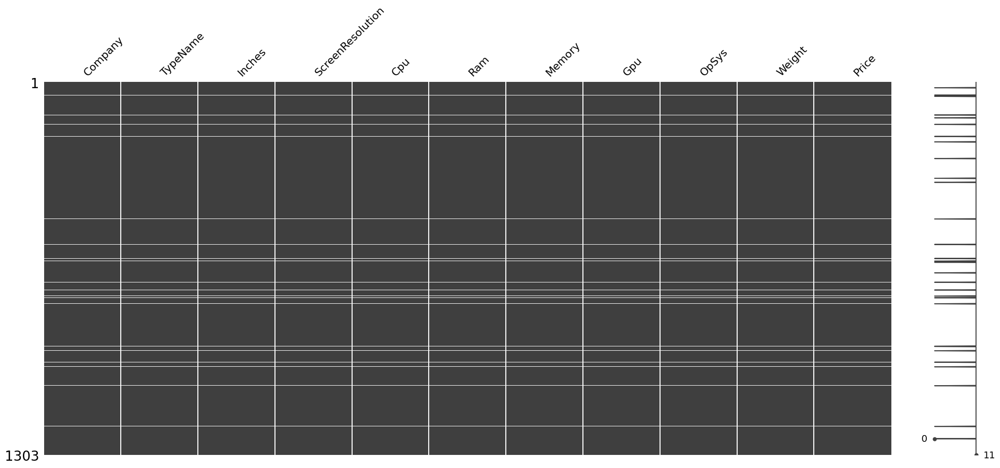

In [ ]:
#create matrix plot to see the pattern in missing values
msno.matrix(df)

In [ ]:
a = df[df.isnull().any(axis = 1)]

In [ ]:
a.shape

(30, 11)

# total 30 rows have null values

In [ ]:
#percentage of total null values
df.isnull().sum().sum()*100 / df.shape[0]

25.326170376055256

In [ ]:
#remove all rows that are completely null
#cause if row is completely null there is no meaning to apply imputation technique

#to drop rows with entirely missing values
df = df.dropna(how = 'all')

In [ ]:
df.shape

(1273, 11)

In [ ]:
df.isnull().sum()             # all missing values are removed

,0
Company,0
TypeName,0
Inches,0
ScreenResolution,0
Cpu,0
Ram,0
Memory,0
Gpu,0
OpSys,0
Weight,0


In [ ]:
df.shape

(1273, 13)

In [ ]:
df1 = df.copy()

In [ ]:
df.columns

Index(['Company', 'TypeName', 'Inches', 'ScreenResolution', 'Cpu', 'Ram',
       'Memory', 'Gpu', 'OpSys', 'Weight', 'Price'],
      dtype='object')

In [ ]:
df['Company'].unique()

array(['Apple', 'HP', 'Acer', 'Asus', 'Dell', 'Lenovo', 'Chuwi', 'MSI',
       'Microsoft', 'Toshiba', 'Huawei', 'Xiaomi', 'Vero', 'Razer',
       'Mediacom', 'Samsung', 'Google', 'Fujitsu', 'LG'], dtype=object)

In [ ]:
df['Company'].nunique()

19

total 19 unique companies are there

In [ ]:
df['TypeName'].unique()

array(['Ultrabook', 'Notebook', 'Gaming', '2 in 1 Convertible',
       'Workstation', 'Netbook'], dtype=object)

In [ ]:
df['ScreenResolution'].unique()

array(['IPS Panel Retina Display 2560x1600', '1440x900',
       'Full HD 1920x1080', 'IPS Panel Retina Display 2880x1800',
       '1366x768', 'IPS Panel Full HD 1920x1080',
       'IPS Panel Retina Display 2304x1440',
       'IPS Panel Full HD / Touchscreen 1920x1080',
       'Full HD / Touchscreen 1920x1080',
       'Touchscreen / Quad HD+ 3200x1800', 'Touchscreen 2256x1504',
       'Quad HD+ / Touchscreen 3200x1800', 'IPS Panel 1366x768',
       'IPS Panel 4K Ultra HD / Touchscreen 3840x2160',
       'IPS Panel Full HD 2160x1440',
       '4K Ultra HD / Touchscreen 3840x2160', '1600x900',
       'IPS Panel 4K Ultra HD 3840x2160', '4K Ultra HD 3840x2160',
       'Touchscreen 1366x768', 'Touchscreen 2560x1440',
       'IPS Panel Full HD 1366x768', 'IPS Panel 2560x1440',
       'IPS Panel Full HD 2560x1440',
       'IPS Panel Retina Display 2736x1824', 'Touchscreen 2400x1600',
       '2560x1440', 'IPS Panel Quad HD+ 2560x1440',
       'IPS Panel Quad HD+ 3200x1800',
       'IPS Panel Qua

In [ ]:
df['ScreenResolution'].nunique()

40

In [ ]:
df['Cpu'].unique()

array(['Intel Core i5 2.3GHz', 'Intel Core i5 1.8GHz',
       'Intel Core i5 7200U 2.5GHz', 'Intel Core i7 2.7GHz',
       'Intel Core i5 3.1GHz', 'AMD A9-Series 9420 3GHz',
       'Intel Core i7 2.2GHz', 'Intel Core i7 8550U 1.8GHz',
       'Intel Core i5 8250U 1.6GHz', 'Intel Core i3 6006U 2GHz',
       'Intel Core i7 2.8GHz', 'Intel Core M m3 1.2GHz',
       'Intel Core i7 7500U 2.7GHz', 'Intel Core i7 2.9GHz',
       'Intel Core i3 7100U 2.4GHz', 'Intel Core i5 7300HQ 2.5GHz',
       'AMD E-Series E2-9000e 1.5GHz', 'Intel Core i5 1.6GHz',
       'Intel Core i7 8650U 1.9GHz', 'Intel Atom x5-Z8300 1.44GHz',
       'AMD E-Series E2-6110 1.5GHz', 'AMD A6-Series 9220 2.5GHz',
       'Intel Celeron Dual Core N3350 1.1GHz',
       'Intel Core i3 7130U 2.7GHz', 'Intel Core i7 7700HQ 2.8GHz',
       'Intel Core i5 2.0GHz', 'AMD Ryzen 1700 3GHz',
       'Intel Pentium Quad Core N4200 1.1GHz',
       'Intel Celeron Dual Core N3060 1.6GHz', 'Intel Core i5 1.3GHz',
       'AMD FX 9830P 3GHz', '

In [ ]:
df['Cpu'].nunique()

118

In [ ]:
df['Memory'].unique()

array(['128GB SSD', '128GB Flash Storage', '256GB SSD', '512GB SSD',
       '500GB HDD', '256GB Flash Storage', '1TB HDD',
       '128GB SSD +  1TB HDD', '256GB SSD +  256GB SSD',
       '64GB Flash Storage', '32GB Flash Storage', '256GB SSD +  1TB HDD',
       '256GB SSD +  2TB HDD', '32GB SSD', '2TB HDD', '64GB SSD',
       '1.0TB Hybrid', '512GB SSD +  1TB HDD', '1TB SSD',
       '256GB SSD +  500GB HDD', '128GB SSD +  2TB HDD',
       '512GB SSD +  512GB SSD', '16GB SSD', '16GB Flash Storage',
       '512GB SSD +  256GB SSD', '512GB SSD +  2TB HDD',
       '64GB Flash Storage +  1TB HDD', '180GB SSD', '1TB HDD +  1TB HDD',
       '32GB HDD', '1TB SSD +  1TB HDD', '?', '512GB Flash Storage',
       '128GB HDD', '240GB SSD', '8GB SSD', '508GB Hybrid', '1.0TB HDD',
       '512GB SSD +  1.0TB Hybrid', '256GB SSD +  1.0TB Hybrid'],
      dtype=object)

In [ ]:
df['Ram'].unique()

array(['8GB', '16GB', '4GB', '2GB', '12GB', '64GB', '6GB', '32GB', '24GB',
       '1GB'], dtype=object)

In [ ]:
df['OpSys'].unique()

array(['macOS', 'No OS', 'Windows 10', 'Mac OS X', 'Linux',
       'Windows 10 S', 'Chrome OS', 'Windows 7', 'Android'], dtype=object)

In [ ]:
df['OpSys'].unique()

array(['macOS', 'No OS', 'Windows 10', 'Mac OS X', 'Linux',
       'Windows 10 S', 'Chrome OS', 'Windows 7', 'Android'], dtype=object)

In [ ]:
df['Gpu'].unique()

array(['Intel Iris Plus Graphics 640', 'Intel HD Graphics 6000',
       'Intel HD Graphics 620', 'AMD Radeon Pro 455',
       'Intel Iris Plus Graphics 650', 'AMD Radeon R5',
       'Intel Iris Pro Graphics', 'Nvidia GeForce MX150',
       'Intel UHD Graphics 620', 'Intel HD Graphics 520',
       'AMD Radeon Pro 555', 'AMD Radeon R5 M430',
       'Intel HD Graphics 615', 'AMD Radeon Pro 560',
       'Nvidia GeForce 940MX', 'Nvidia GeForce GTX 1050', 'AMD Radeon R2',
       'AMD Radeon 530', 'Nvidia GeForce 930MX', 'Intel HD Graphics',
       'Intel HD Graphics 500', 'Nvidia GeForce 930MX ',
       'Nvidia GeForce GTX 1060', 'Nvidia GeForce 150MX',
       'Intel Iris Graphics 540', 'AMD Radeon RX 580',
       'Nvidia GeForce 920MX', 'AMD Radeon R4 Graphics', 'AMD Radeon 520',
       'Nvidia GeForce GTX 1070', 'Nvidia GeForce GTX 1050 Ti',
       'Intel HD Graphics 400', 'Nvidia GeForce MX130', 'AMD R4 Graphics',
       'Nvidia GeForce GTX 940MX', 'AMD Radeon RX 560',
       'Nvidia GeFo

In [ ]:
df['Weight'].unique()

array(['1.37kg', '1.34kg', '1.86kg', '1.83kg', '2.1kg', '2.04kg', '1.3kg',
       '1.6kg', '2.2kg', '0.92kg', '1.22kg', '2.5kg', '1.62kg', '1.91kg',
       '2.3kg', '1.35kg', '1.88kg', '1.89kg', '1.65kg', '2.71kg', '1.2kg',
       '1.44kg', '2.8kg', '2kg', '2.65kg', '2.77kg', '3.2kg', '1.49kg',
       '2.4kg', '2.13kg', '2.43kg', '1.7kg', '1.4kg', '1.8kg', '1.9kg',
       '3kg', '1.252kg', '2.7kg', '2.02kg', '1.63kg', '1.96kg', '1.21kg',
       '2.45kg', '1.25kg', '1.5kg', '2.62kg', '1.38kg', '1.58kg',
       '1.85kg', '1.23kg', '2.16kg', '2.36kg', '7.2kg', '2.05kg',
       '1.32kg', '1.75kg', '0.97kg', '2.56kg', '1.48kg', '1.74kg',
       '1.1kg', '1.56kg', '2.03kg', '1.05kg', '5.4kg', '4.4kg', '1.90kg',
       '1.29kg', '2.0kg', '1.95kg', '2.06kg', '1.12kg', '3.49kg',
       '3.35kg', '2.23kg', '?', '2.9kg', '4.42kg', '2.69kg', '2.37kg',
       '4.7kg', '3.6kg', '2.08kg', '4.3kg', '1.68kg', '1.41kg', '4.14kg',
       '2.18kg', '2.24kg', '2.67kg', '4.1kg', '2.14kg', '1.36kg',
       '

In [ ]:
#replacing '?' values with nan so that we can use imputation technique to calculate those values
df.replace('?', np.nan, inplace = True)

In [ ]:
df2 = df.copy()

In [ ]:
df.isnull().sum()

,0
Company,0
TypeName,0
Inches,1
ScreenResolution,0
Cpu,0
Ram,0
Memory,1
Gpu,0
OpSys,0
Weight,1


In [ ]:
df['Inches'] = pd.to_numeric(df['Inches'])            # to convert datatype from categorical to numeric

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1273 entries, 0 to 1302
Data columns (total 11 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Company           1273 non-null   object 
 1   TypeName          1273 non-null   object 
 2   Inches            1272 non-null   float64
 3   ScreenResolution  1273 non-null   object 
 4   Cpu               1273 non-null   object 
 5   Ram               1273 non-null   object 
 6   Memory            1272 non-null   object 
 7   Gpu               1273 non-null   object 
 8   OpSys             1273 non-null   object 
 9   Weight            1272 non-null   object 
 10  Price             1273 non-null   float64
dtypes: float64(2), object(9)
memory usage: 119.3+ KB


In [ ]:
df['Ram_in_GB'] = pd.to_numeric(df['Ram'].str.replace('GB', '', regex = False))

In [ ]:
df['Ram_in_GB'].unique()

array([ 8, 16,  4,  2, 12, 64,  6, 32, 24,  1])

In [ ]:
df['Weight(kg)'] = pd.to_numeric(df['Weight'].str.replace('kg', '', regex = False))

In [ ]:
df['Weight(kg)'].unique()

array([1.370e+00, 1.340e+00, 1.860e+00, 1.830e+00, 2.100e+00, 2.040e+00,
       1.300e+00, 1.600e+00, 2.200e+00, 9.200e-01, 1.220e+00, 2.500e+00,
       1.620e+00, 1.910e+00, 2.300e+00, 1.350e+00, 1.880e+00, 1.890e+00,
       1.650e+00, 2.710e+00, 1.200e+00, 1.440e+00, 2.800e+00, 2.000e+00,
       2.650e+00, 2.770e+00, 3.200e+00, 1.490e+00, 2.400e+00, 2.130e+00,
       2.430e+00, 1.700e+00, 1.400e+00, 1.800e+00, 1.900e+00, 3.000e+00,
       1.252e+00, 2.700e+00, 2.020e+00, 1.630e+00, 1.960e+00, 1.210e+00,
       2.450e+00, 1.250e+00, 1.500e+00, 2.620e+00, 1.380e+00, 1.580e+00,
       1.850e+00, 1.230e+00, 2.160e+00, 2.360e+00, 7.200e+00, 2.050e+00,
       1.320e+00, 1.750e+00, 9.700e-01, 2.560e+00, 1.480e+00, 1.740e+00,
       1.100e+00, 1.560e+00, 2.030e+00, 1.050e+00, 5.400e+00, 4.400e+00,
       1.290e+00, 1.950e+00, 2.060e+00, 1.120e+00, 3.490e+00, 3.350e+00,
       2.230e+00,       nan, 2.900e+00, 4.420e+00, 2.690e+00, 2.370e+00,
       4.700e+00, 3.600e+00, 2.080e+00, 4.300e+00, 

In [ ]:
df = df.drop(columns = ['Ram', 'Weight'], axis = 1)

In [ ]:
df.head()

,Company,TypeName,Inches,ScreenResolution,Cpu,Memory,Gpu,OpSys,Price,Ram_in_GB,Weight(kg)
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,128GB SSD,Intel Iris Plus Graphics 640,macOS,71378.6832,8,1.37
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,128GB Flash Storage,Intel HD Graphics 6000,macOS,47895.5232,8,1.34
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,256GB SSD,Intel HD Graphics 620,No OS,30636.0000,8,1.86
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,512GB SSD,AMD Radeon Pro 455,macOS,135195.3360,16,1.83
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,256GB SSD,Intel Iris Plus Graphics 650,macOS,96095.8080,8,1.37


In [ ]:
df.shape

(1273, 11)

In [ ]:
df3 = df.copy()

#Imputation  
here we have null values in 3 columns which is 'Inches' , 'Memory' and 'weight' in which memory is a categorical data type so we can't use mean, median or constant type of imputation technique for it so let's use KNN and MICE imputation techniques to treat the missing values

In [ ]:
# let's first do the simple imputation
from sklearn.impute import SimpleImputer

# Impute missing values with the mode for memory
df3['Memory'].fillna(df3['Memory'].mode()[0], inplace = True)

In [ ]:
df3.isnull().sum()

,0
Company,0
TypeName,0
Inches,1
ScreenResolution,0
Cpu,0
Memory,0
Gpu,0
OpSys,0
Price,0
Ram_in_GB,0


<Axes: >

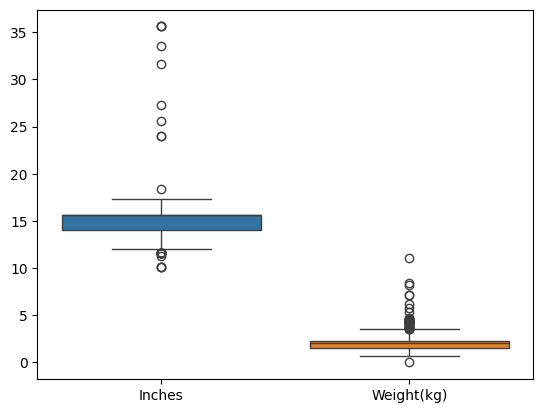

In [ ]:
sns.boxplot(data = df3[['Inches', 'Weight(kg)']])

there are outliers present in both the features that's why i'm using 'median imputation' technique to fill the missing values

In [ ]:
df3[['Inches', 'Weight(kg)']] = df3[['Inches', 'Weight(kg)']].fillna(df3[['Inches', 'Weight(kg)']].median())

In [ ]:
df3.isnull().sum()

,0
Company,0
TypeName,0
Inches,0
ScreenResolution,0
Cpu,0
Memory,0
Gpu,0
OpSys,0
Price,0
Ram_in_GB,0


In [ ]:
df3.shape

(1273, 11)

In [ ]:
df4 = df.copy()    #dataframe without imputation

In [ ]:
df_en = pd.get_dummies(df4, columns = ['Company', 'TypeName', 'ScreenResolution', 'Cpu', 'Memory', 'Gpu', 'OpSys'], drop_first = True)

In [ ]:
df_en.head()

,Inches,Price,Ram_in_GB,Weight(kg),Company_Apple,Company_Asus,Company_Chuwi,Company_Dell,Company_Fujitsu,Company_Google,...,Gpu_Nvidia Quadro M620,Gpu_Nvidia Quadro M620M,OpSys_Chrome OS,OpSys_Linux,OpSys_Mac OS X,OpSys_No OS,OpSys_Windows 10,OpSys_Windows 10 S,OpSys_Windows 7,OpSys_macOS
0,13.3,71378.6832,8,1.37,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
1,13.3,47895.5232,8,1.34,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
2,15.6,30636.0000,8,1.86,False,False,False,False,False,False,...,False,False,False,False,False,True,False,False,False,False
3,15.4,135195.3360,16,1.83,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
4,13.3,96095.8080,8,1.37,True,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


In [ ]:
for col in df_en.iloc[:, 4:]:
  df_en[col] = df_en[col].map({True: 1, False: 0})

In [ ]:
df_en.columns[df_en.isna().any()].tolist()

['Inches', 'Weight(kg)']

#imputation

In [ ]:
# Median imputation
df_median = df_en.copy()         # creating a copy for further evaluation
median_imputer = SimpleImputer(strategy='median')
df_median.iloc[:, :] = median_imputer.fit_transform(df_median)

In [ ]:
pip install fancyimpute

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 kB 4.0 MB/s eta 0:00:00
  Created wheel for fancyimpute: filename=fancyimpute-0.7.0-py3-none-any.whl size=29880 sha256=cb02ce0c789f2f763fd89db68278454f0026c8bddd522069897b3ed53b3f56cf
  Stored in directory: /root/.cache/pip/wheels/7b/0c/d3/ee82d1fbdcc0858d96434af108608d01703505d453720c84ed
  Created wheel for knnimpute: filename=knnimpute-0.1.0-py3-none-any.whl size=11330 sha256=b2ce870d01b96a8cf243d280f7add832e894075840522a48b7a14c54fba0a6e2
  Stored in directory: /root/.cache/pip/wheels/46/06/a5/45a724630562413c374e29c08732411d496092408b3a7bf754
Successfully built fancyimpute knnimpute


In [ ]:
# KNN imputation for missing values
from fancyimpute import KNN
knn_imputer = KNN()
df_knn = df_en.copy()
df_knn.iloc[:, :] = knn_imputer.fit_transform(df_knn)

Imputing row 1/1273 with 0 missing, elapsed time: 2.293
Imputing row 101/1273 with 0 missing, elapsed time: 2.293
Imputing row 201/1273 with 0 missing, elapsed time: 2.294
Imputing row 301/1273 with 0 missing, elapsed time: 2.295
Imputing row 401/1273 with 0 missing, elapsed time: 2.296
Imputing row 501/1273 with 0 missing, elapsed time: 2.296
Imputing row 601/1273 with 0 missing, elapsed time: 2.296
Imputing row 701/1273 with 0 missing, elapsed time: 2.297
Imputing row 801/1273 with 0 missing, elapsed time: 2.297
Imputing row 901/1273 with 0 missing, elapsed time: 2.297
Imputing row 1001/1273 with 0 missing, elapsed time: 2.298
Imputing row 1101/1273 with 0 missing, elapsed time: 2.298
Imputing row 1201/1273 with 0 missing, elapsed time: 2.298


In [ ]:
#Mice imputation for missing values
from fancyimpute import IterativeImputer
mice_imputer = IterativeImputer()
df_mice = df_en.copy()
df_mice.iloc[:, :] = mice_imputer.fit_transform(df_mice)

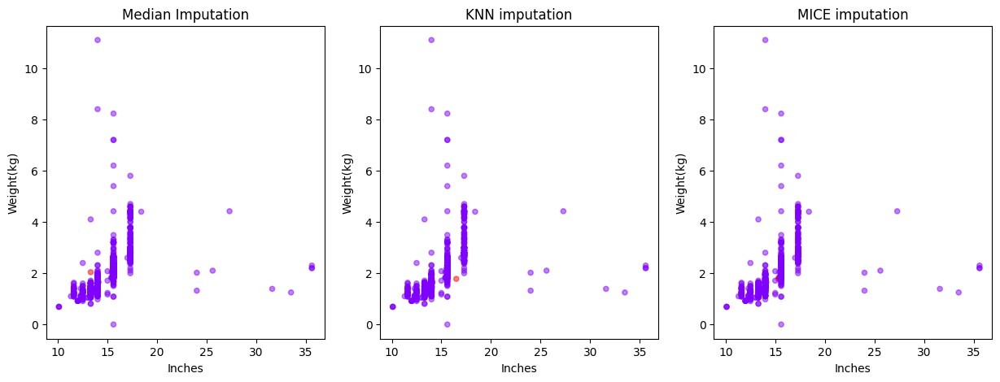

In [ ]:
#ploting each of the imputation results and picking the best among all
fig, axes = plt.subplots(nrows = 1, ncols = 3, figsize = (15,5))
nulity = df_en['Inches'].isnull() + df_en['Weight(kg)'].isnull()            # we want to specify the color values for the data points based on the nullity values
imputations = {'Median Imputation': df_median,
               'KNN imputation': df_knn,
               'MICE imputation': df_mice}
#This loop iterates through the subplot axes and the keys of the imputations dictionary simultaneously using the zip() function.
#axes.flatten() is used to flatten the 2D array of subplot axes into a 1D array.
for ax, df_key in zip(axes.flatten(), imputations):
  #For each iteration of the loop, it accesses the DataFrame associated with the current df_key from the imputations dictionary.
  imputations[df_key].plot(x = 'Inches', y = 'Weight(kg)', kind = 'scatter',
                            alpha = 0.5, c = nulity, cmap = 'rainbow', ax = ax,
                           colorbar = False, title = df_key)

  #alpha=0.5 controls the transparency of the data points in the scatter plot.
    #c=nullity specifies the color values for the data points based on the nullity values. This could be a measure of missingness in the dataset.
    #cmap='rainbow' specifies the colormap to be used for coloring the data points.
    #ax=ax assigns the current subplot axis to which the scatter plot will be added.
    #colorbar=False suppresses the display of the colorbar.

all imputations gave the simmilar results hence here i'm using median imputations for further analysis.

In [ ]:
df_median.head()

,Inches,Price,Ram_in_GB,Weight(kg),Company_Apple,Company_Asus,Company_Chuwi,Company_Dell,Company_Fujitsu,Company_Google,...,Gpu_Nvidia Quadro M620,Gpu_Nvidia Quadro M620M,OpSys_Chrome OS,OpSys_Linux,OpSys_Mac OS X,OpSys_No OS,OpSys_Windows 10,OpSys_Windows 10 S,OpSys_Windows 7,OpSys_macOS
0,13.3,71378.6832,8,1.37,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,13.3,47895.5232,8,1.34,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,15.6,30636.0000,8,1.86,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,15.4,135195.3360,16,1.83,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,13.3,96095.8080,8,1.37,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
df_median.shape

(1273, 338)

# Data Visualization

univariate analysis --   
here we check distribution of data
-if its numerical data then whether its normally distibuted or skewed.  
and for categorical data check whether the categories are balanced or not.

In [ ]:
df4.head()

,Company,TypeName,Inches,ScreenResolution,Cpu,Memory,Gpu,OpSys,Price,Ram_in_GB,Weight(kg)
0,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 2.3GHz,128GB SSD,Intel Iris Plus Graphics 640,macOS,71378.6832,8,1.37
1,Apple,Ultrabook,13.3,1440x900,Intel Core i5 1.8GHz,128GB Flash Storage,Intel HD Graphics 6000,macOS,47895.5232,8,1.34
2,HP,Notebook,15.6,Full HD 1920x1080,Intel Core i5 7200U 2.5GHz,256GB SSD,Intel HD Graphics 620,No OS,30636.0000,8,1.86
3,Apple,Ultrabook,15.4,IPS Panel Retina Display 2880x1800,Intel Core i7 2.7GHz,512GB SSD,AMD Radeon Pro 455,macOS,135195.3360,16,1.83
4,Apple,Ultrabook,13.3,IPS Panel Retina Display 2560x1600,Intel Core i5 3.1GHz,256GB SSD,Intel Iris Plus Graphics 650,macOS,96095.8080,8,1.37


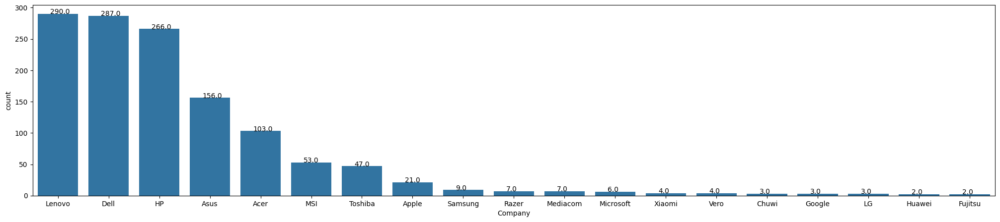

In [ ]:
plt.figure(figsize = (25,5))
ax = sns.countplot(x = df4.Company, order=df4['Company'].value_counts().index)
for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

maximum selling laptops are of 'lenovo', 'dell' and 'hp' company followed by 'asus', 'acer' and then others

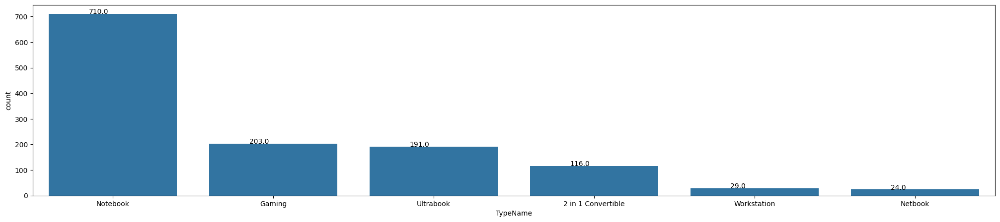

In [ ]:
plt.figure(figsize = (25,5))
ax = sns.countplot(x = df4.TypeName, order=df4['TypeName'].value_counts().index)

for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

most selling type is 'Notebook' and least selling type is 'Netbook'

<Axes: xlabel='Inches', ylabel='Count'>

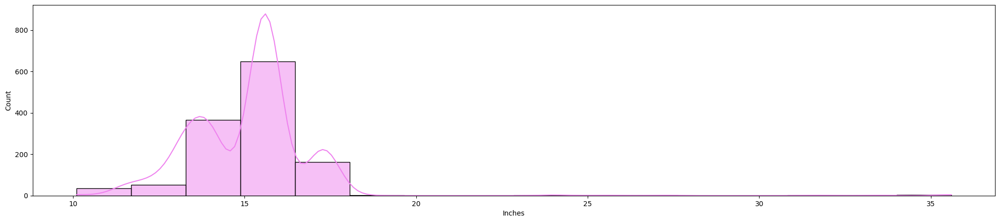

In [ ]:
df_sorted = df4['Inches'].sort_values()
plt.figure(figsize = (25,5))
sns.histplot(data = df_sorted, color = 'violet', kde = True, bins = 16)

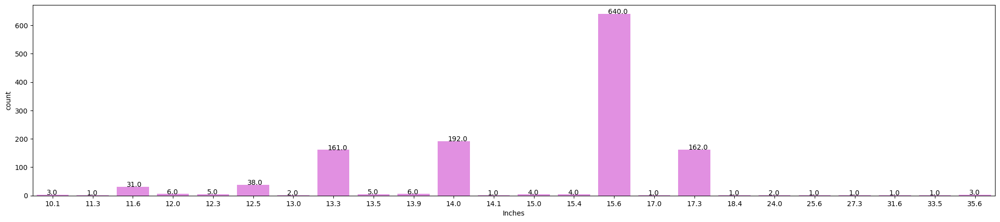

In [ ]:
df_sorted = df4['Inches'].sort_values()
plt.figure(figsize = (25,5))
ax = sns.countplot(x = df_sorted, color = 'violet')

for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

maximum laptops are of '15.6' inches followed by '14', '13.3' and '17.3' inches

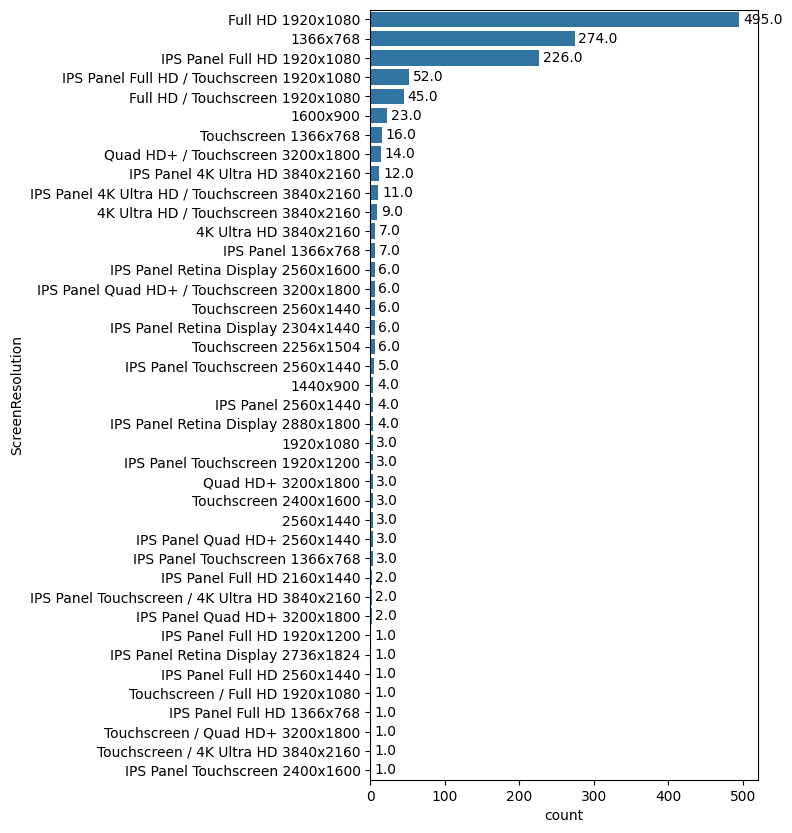

In [ ]:
plt.figure(figsize = (5,10))
ax = sns.countplot(y = df4['ScreenResolution'], order = df4['ScreenResolution'].value_counts().index)

for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_width()), (p.get_width()+5, p.get_y() + p.get_height() / 2), va='center')
plt.show()

most selling laptops are of screenresolution 'Full HD 1920x1080' followed by '1366x768' and 'IPS Panel Full HD 1920x1080'

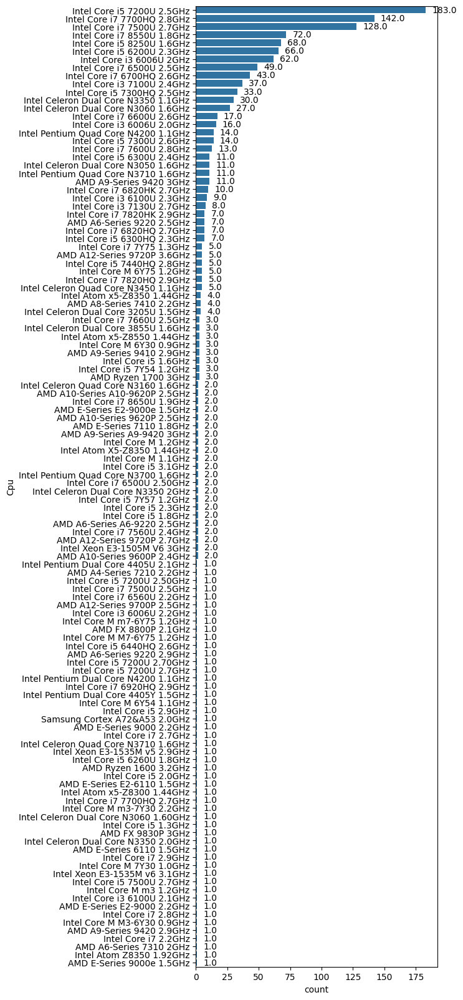

In [ ]:
plt.figure(figsize = (5,20))
ax = sns.countplot(y = df4['Cpu'], order = df4['Cpu'].value_counts().index)

for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_width()), (p.get_width()+5, p.get_y() + p.get_height() / 2), va='center')
plt.show()

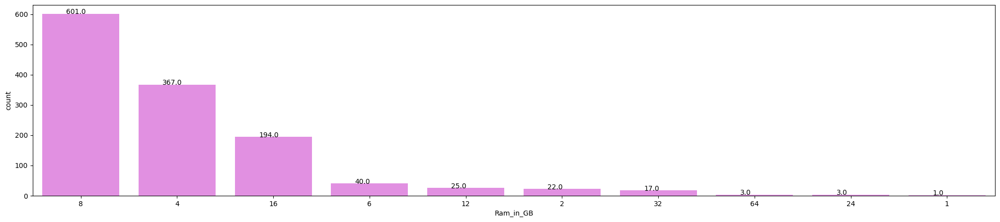

In [ ]:
plt.figure(figsize = (25,5))
ax = sns.countplot(x = df4['Ram_in_GB'], color = 'violet', order = df4['Ram_in_GB'].value_counts().index)

for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

most preferred laptops having '8gb' Ram followed by '4gb' and '16gb'

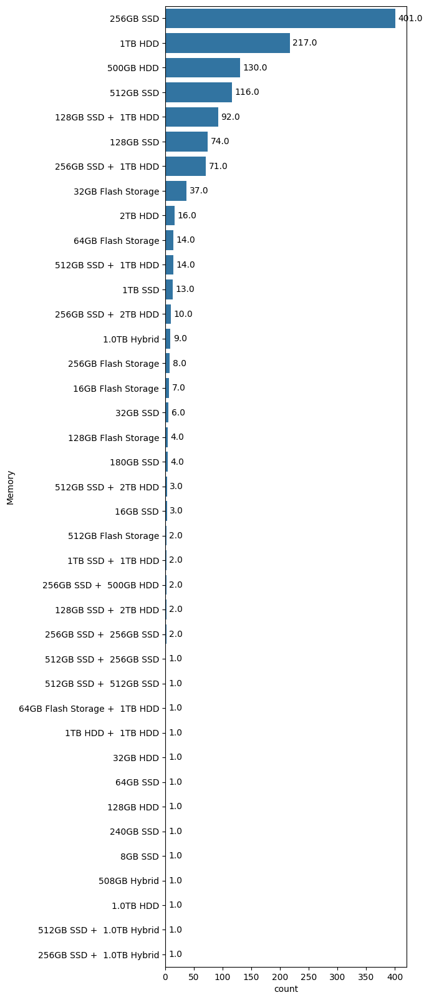

In [ ]:
plt.figure(figsize = (5,20))
ax = sns.countplot(y = df4['Memory'], order = df4['Memory'].value_counts().index)

for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_width()), (p.get_width()+5, p.get_y() + p.get_height() / 2), va='center')
plt.show()

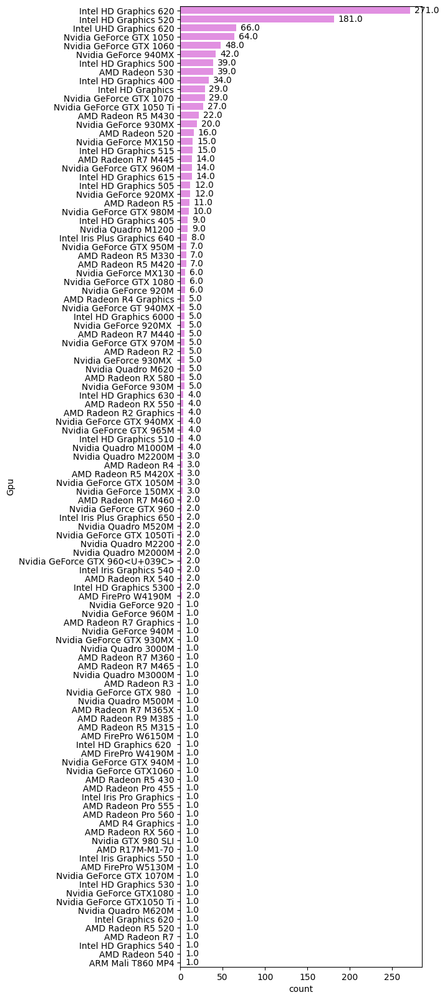

In [ ]:
plt.figure(figsize = (5,20))
ax = sns.countplot(y = df4['Gpu'], order = df4['Gpu'].value_counts().index, color = 'violet')

for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_width()), (p.get_width()+5, p.get_y() + p.get_height() / 2), va='center')
plt.show()

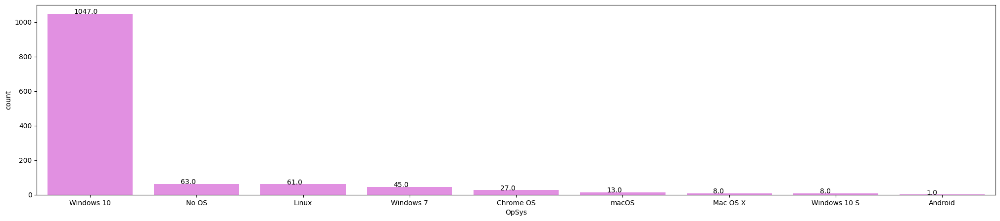

In [ ]:
plt.figure(figsize = (25,5))
ax = sns.countplot(x = df4['OpSys'], color = 'violet', order = df4['OpSys'].value_counts().index)

for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))
plt.show()

most preferred laptops having Windows 10 as operating system

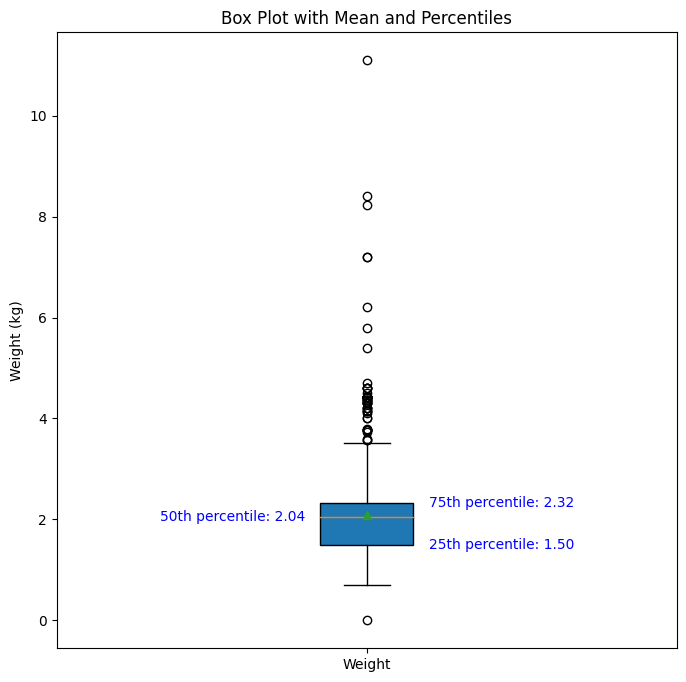

In [ ]:
plt.figure(figsize=(8, 8))

# Assuming df4['Weight(kg)'] is your data
box = plt.boxplot(df3['Weight(kg)'], patch_artist=True, showmeans=True)

# Calculate percentiles
percentiles = np.percentile(df3['Weight(kg)'], [25, 50, 75])

# Add text annotations for the percentiles
plt.text(1.1, percentiles[0], f'25th percentile: {percentiles[0]:.2f}', ha='left', va='center', color='blue')
plt.text(0.9, percentiles[1], f'50th percentile: {percentiles[1]:.2f}', ha='right', va='center', color='blue')
plt.text(1.1, percentiles[2], f'75th percentile: {percentiles[2]:.2f}', ha='left', va='center', color='blue')

# Set plot title and labels
plt.title('Box Plot with Mean and Percentiles')
plt.ylabel('Weight (kg)')
plt.xticks([1], ['Weight'])

plt.show()

In [ ]:
import plotly.express as px

In [ ]:
px.box(df4, y='Weight(kg)', title='Boxplot of Weights')

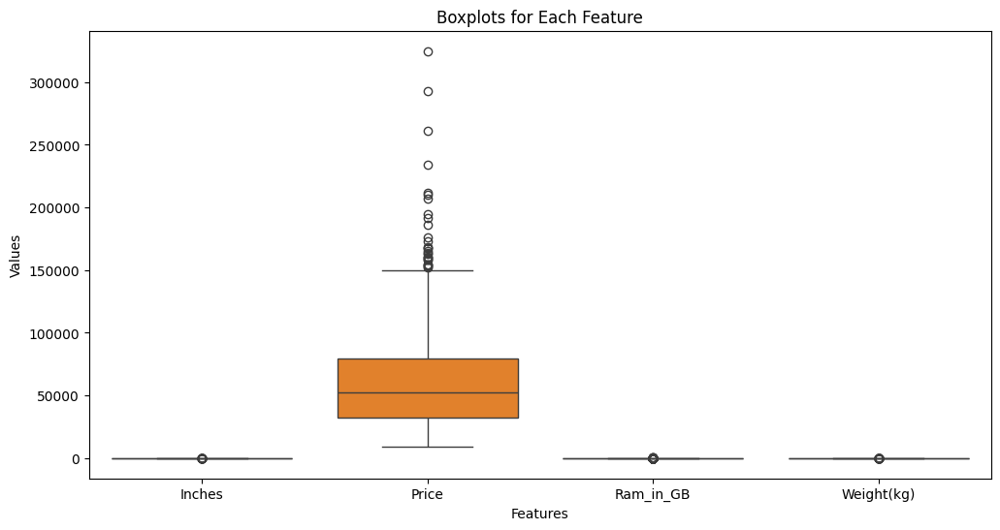

In [ ]:
plt.figure(figsize = (12,6))
sns.boxplot(data = df4)

plt.title('Boxplots for Each Feature')
plt.xlabel('Features')
plt.ylabel('Values')

plt.show()

here we can see all the numerical features have outliers.

In [ ]:
df5 = df3.copy()

In [ ]:
columns = ['Inches', 'Price', 'Ram_in_GB', 'Weight(kg)']

for col in columns:
  df5[f'Zscore_{col}'] = (df5[col] - df5[col].mean()) / df5[col].std(ddof = 0)
  df5[f'Zscore_{col}'].unique()

In [ ]:
#usually we will consider anything more than 3SD as an outlier.
df5[(df5[f'Zscore_{col}']>3)]

,Company,TypeName,Inches,ScreenResolution,Cpu,Memory,Gpu,OpSys,Price,Ram_in_GB,Weight(kg),Zscore_Inches,Zscore_Price,Zscore_Ram_in_GB,Zscore_Weight(kg)
133,Acer,Notebook,15.6,Full HD 1920x1080,Intel Core i3 7130U 2.7GHz,256GB SSD,Nvidia GeForce MX130,Windows 10,30476.1600,4,7.20,0.240055,-0.789967,-0.802321,6.346107
173,Toshiba,Notebook,15.6,1366x768,Intel Core i3 7100U 2.4GHz,500GB HDD,Intel HD Graphics 620,Windows 10,26053.9200,4,5.40,0.240055,-0.908470,-0.802321,4.116104
238,Asus,Gaming,17.3,Full HD 1920x1080,Intel Core i7 7820HK 2.9GHz,512GB SSD + 1TB HDD,Nvidia GeForce GTX 1080,Windows 10,207259.2000,32,4.70,1.110535,3.947291,4.231638,3.248881
240,Lenovo,Notebook,15.6,1366x768,Intel Core i3 6006U 2GHz,128GB SSD,Intel HD Graphics 520,Windows 10,31381.9200,8,7.20,0.240055,-0.765695,-0.083184,6.346107
302,Lenovo,Notebook,17.3,1600x900,Intel Core i5 7200U 2.5GHz,1TB HDD,Nvidia GeForce GTX 940M,Windows 10,34578.7200,6,5.80,1.110535,-0.680030,-0.442752,4.611660
326,Acer,Notebook,15.6,1366x768,Intel Core i5 7200U 2.5GHz,1TB HDD,Intel HD Graphics 620,Windows 10,29250.7200,6,8.23,0.240055,-0.822805,-0.442752,7.622164
577,Lenovo,Gaming,17.3,IPS Panel Full HD 1920x1080,Intel Core i7 6820HK 2.7GHz,256GB SSD + 1TB HDD,Nvidia GeForce GTX 1070,Windows 10,141884.6400,32,4.60,1.110535,2.195448,4.231638,3.124992
585,MSI,Gaming,17.3,Full HD 1920x1080,Intel Core i7 6820HK 2.7GHz,128GB SSD + 1TB HDD,Nvidia GeForce GTX 980M,Windows 10,125154.7200,16,4.50,1.110535,1.747136,1.355090,3.001103
587,Lenovo,Ultrabook,14.0,IPS Panel Full HD 1920x1080,Intel Core i7 6600U 2.6GHz,256GB SSD,Intel HD Graphics 520,Windows 10,89137.4400,12,8.40,-0.579221,0.781981,0.635953,7.832776
630,Asus,Ultrabook,14.0,Full HD 1920x1080,Intel Core i7 7500U 2.7GHz,512GB SSD,Intel HD Graphics 620,Windows 10,101232.0000,16,11.10,-0.579221,1.106079,1.355090,11.177780


we can see we have 13 rows with zscore more than 3.

In [ ]:
df5 = df5.drop(index = df5[(df5[f'Zscore_{col}']>3)].index)

In [ ]:
df5.shape

(1259, 15)

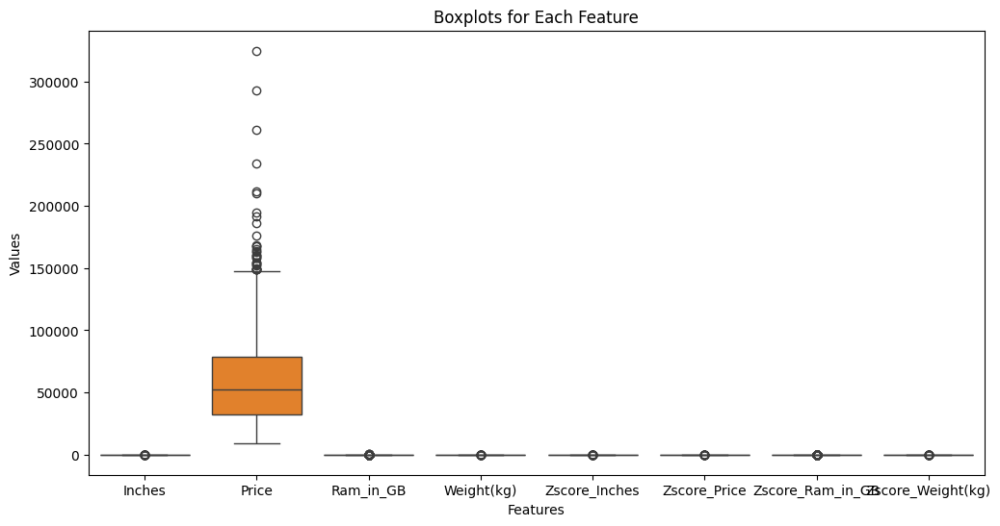

In [ ]:
plt.figure(figsize = (12,6))
sns.boxplot(data = df5)

plt.title('Boxplots for Each Feature')
plt.xlabel('Features')
plt.ylabel('Values')

plt.show()

after applying Zscore still we have outliers

In [ ]:
# let's use IQR method to remove outliers.
#Note: For outliers, statistically it is good to treat extreme outliers (+3 * IQR and -3 * IQR). Minor outliers are OK. As at the end we are using DT, RF ML models etc.

In [ ]:
columns = ['Inches', 'Price', 'Ram_in_GB', 'Weight(kg)']

for col in columns:
    Q1 = df_median[col].quantile(0.25)
    Q3 = df_median[col].quantile(0.75)
    IQR = Q3 - Q1
    upper_bound = Q3 + 1.5 * IQR
    lower_bound = Q1 - 1.5 * IQR

    df_median = df_median[(df_median[col] >= lower_bound) & (df_median[col] <= upper_bound)]

    # Clear and organized output
    print(f"Column: {col}")
    print(f"  25th Percentile (Q1): {Q1:.2f}")
    print(f"  75th Percentile (Q3): {Q3:.2f}")
    print(f"  Interquartile Range (IQR): {IQR:.2f}")
    print(f"  Upper Bound: {upper_bound:.2f}")
    print(f"  Lower Bound: {lower_bound:.2f}")
    print("-" * 40)  # Separator between columns for clarity

Column: Inches
  25th Percentile (Q1): 14.00
  75th Percentile (Q3): 15.60
  Interquartile Range (IQR): 1.60
  Upper Bound: 18.00
  Lower Bound: 11.60
----------------------------------------
Column: Price
  25th Percentile (Q1): 29916.72
  75th Percentile (Q3): 63882.72
  Interquartile Range (IQR): 33966.00
  Upper Bound: 114831.72
  Lower Bound: -21032.28
----------------------------------------
Column: Ram_in_GB
  25th Percentile (Q1): 4.00
  75th Percentile (Q3): 8.00
  Interquartile Range (IQR): 4.00
  Upper Bound: 14.00
  Lower Bound: -2.00
----------------------------------------
Column: Weight(kg)
  25th Percentile (Q1): 1.60
  75th Percentile (Q3): 2.21
  Interquartile Range (IQR): 0.61
  Upper Bound: 3.12
  Lower Bound: 0.69
----------------------------------------


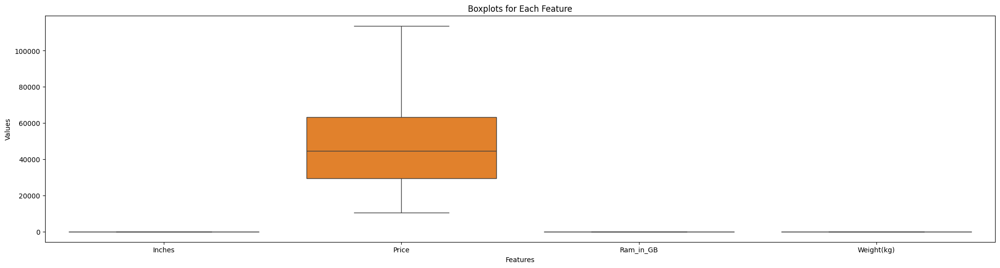

In [ ]:
plt.figure(figsize = (25,6))
sns.boxplot(data = df_median[['Inches', 'Price', 'Ram_in_GB', 'Weight(kg)']])

plt.title('Boxplots for Each Feature')
plt.xlabel('Features')
plt.ylabel('Values')

plt.show()

In [ ]:
df_median.shape

(966, 338)

In [ ]:
list(df_median.columns)

['Inches',
 'Price',
 'Ram_in_GB',
 'Weight(kg)',
 'Company_Apple',
 'Company_Asus',
 'Company_Chuwi',
 'Company_Dell',
 'Company_Fujitsu',
 'Company_Google',
 'Company_HP',
 'Company_Huawei',
 'Company_LG',
 'Company_Lenovo',
 'Company_MSI',
 'Company_Mediacom',
 'Company_Microsoft',
 'Company_Razer',
 'Company_Samsung',
 'Company_Toshiba',
 'Company_Vero',
 'Company_Xiaomi',
 'TypeName_Gaming',
 'TypeName_Netbook',
 'TypeName_Notebook',
 'TypeName_Ultrabook',
 'TypeName_Workstation',
 'ScreenResolution_1440x900',
 'ScreenResolution_1600x900',
 'ScreenResolution_1920x1080',
 'ScreenResolution_2560x1440',
 'ScreenResolution_4K Ultra HD / Touchscreen 3840x2160',
 'ScreenResolution_4K Ultra HD 3840x2160',
 'ScreenResolution_Full HD / Touchscreen 1920x1080',
 'ScreenResolution_Full HD 1920x1080',
 'ScreenResolution_IPS Panel 1366x768',
 'ScreenResolution_IPS Panel 2560x1440',
 'ScreenResolution_IPS Panel 4K Ultra HD / Touchscreen 3840x2160',
 'ScreenResolution_IPS Panel 4K Ultra HD 3840x2

#Bivaritae Analysis

# Numerical-Numerical variables

<Axes: xlabel='Price', ylabel='Inches'>

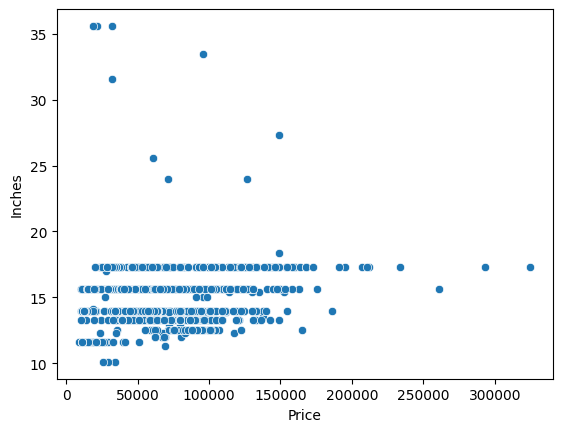

In [ ]:
sns.scatterplot(data = df4, x = 'Price', y = 'Inches')

it shows not much variation in price with respect to Inches

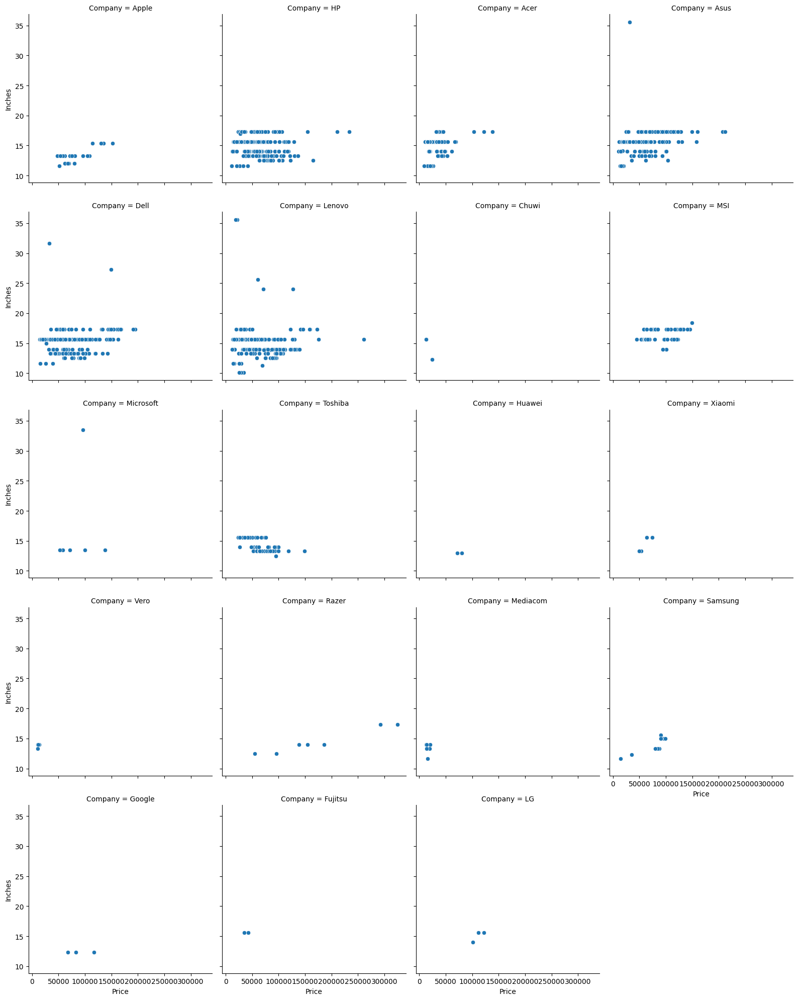

In [ ]:
g = sns.FacetGrid(df4, col="Company", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Inches")
g.add_legend()
plt.show()

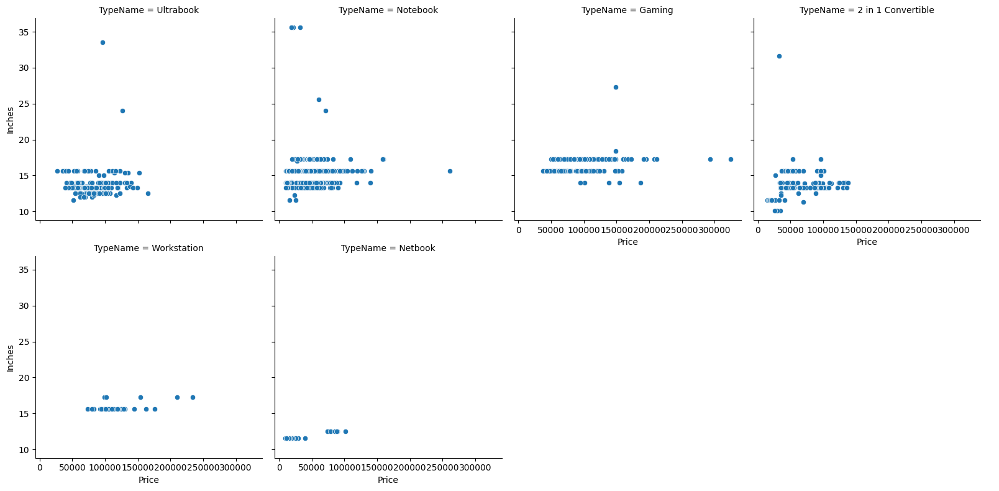

In [ ]:
g = sns.FacetGrid(df4, col="TypeName", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Inches")
g.add_legend()
plt.show()

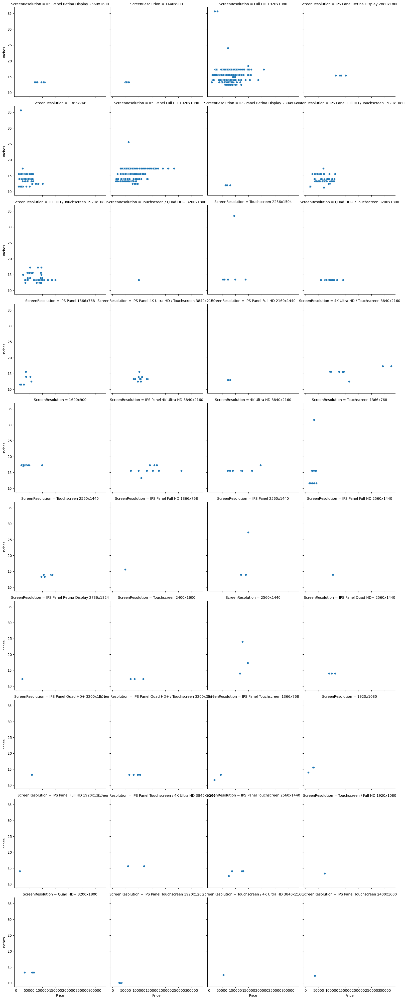

In [ ]:
g = sns.FacetGrid(df4, col="ScreenResolution", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Inches")
g.add_legend()
plt.show()

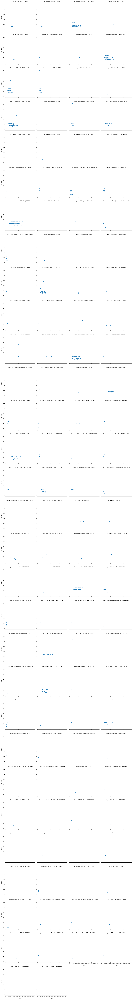

In [ ]:
g = sns.FacetGrid(df4, col="Cpu", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Inches")
g.add_legend()
plt.show()

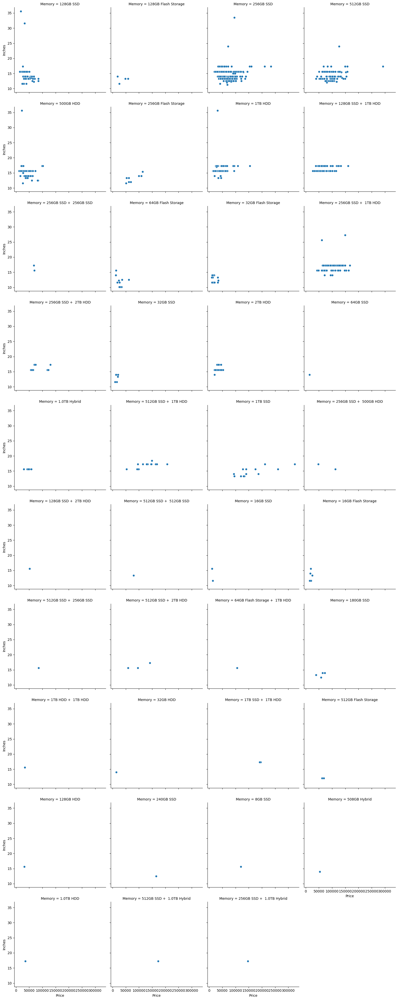

In [ ]:
g = sns.FacetGrid(df4, col="Memory", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Inches")
g.add_legend()
plt.show()

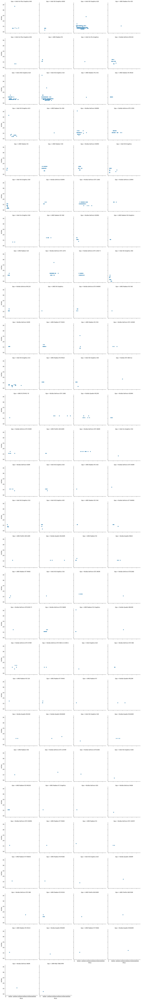

In [ ]:
g = sns.FacetGrid(df4, col="Gpu", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Inches")
g.add_legend()
plt.show()

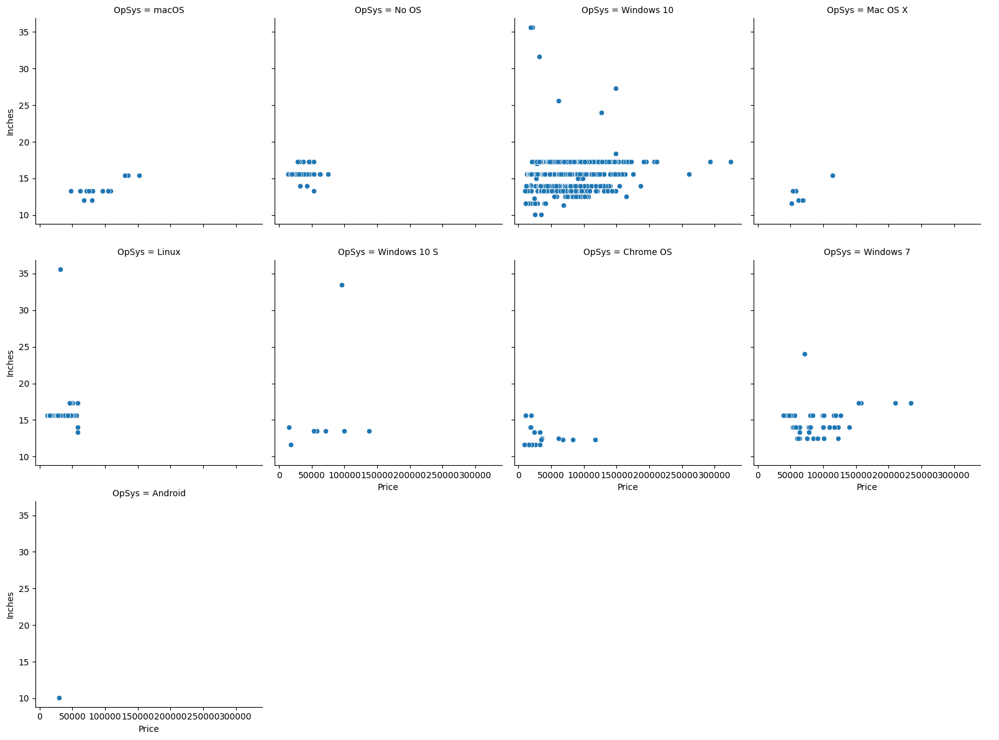

In [ ]:
g = sns.FacetGrid(df4, col="OpSys", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Inches")
g.add_legend()
plt.show()

<Axes: xlabel='Price', ylabel='Ram_in_GB'>

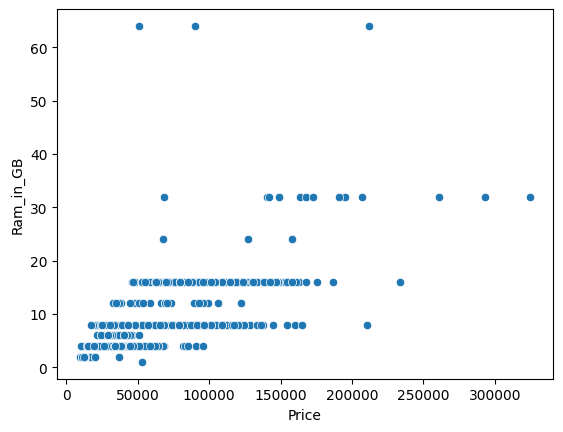

In [ ]:
sns.scatterplot(data = df4, x =  "Price", y =  "Ram_in_GB")

prices are gradually increasing with increase in Ram

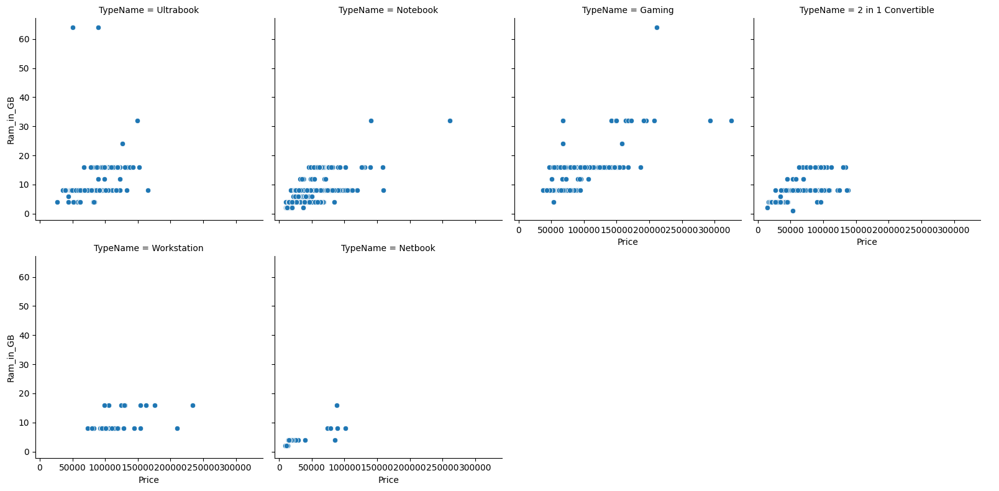

In [ ]:
g = sns.FacetGrid(df4, col="TypeName", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Ram_in_GB")
g.add_legend()
plt.show()

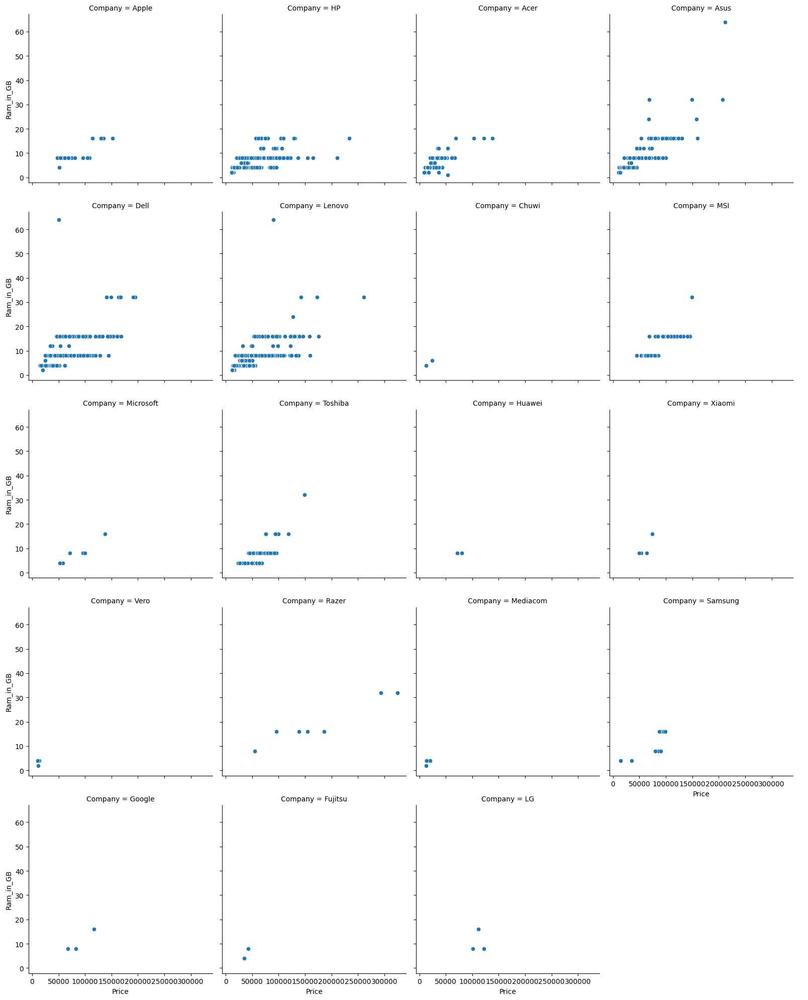

In [ ]:
g = sns.FacetGrid(df4, col="Company", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Ram_in_GB")
g.add_legend()
plt.show()

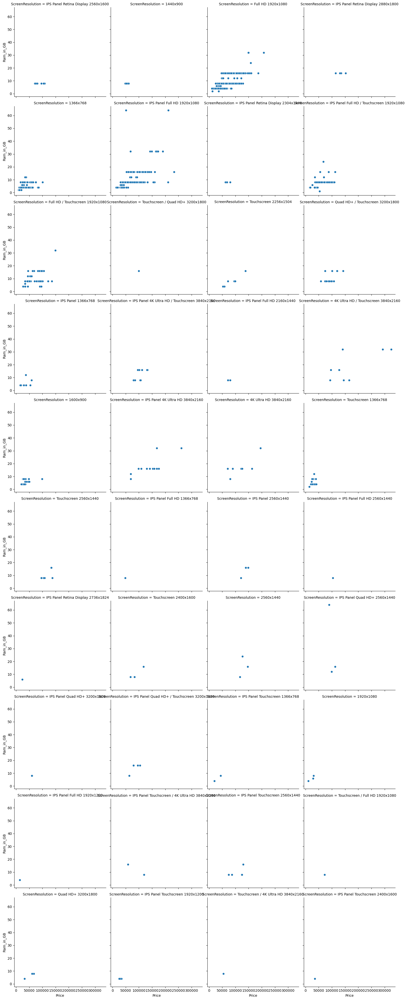

In [ ]:
g = sns.FacetGrid(df4, col="ScreenResolution", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Ram_in_GB")
g.add_legend()
plt.show()

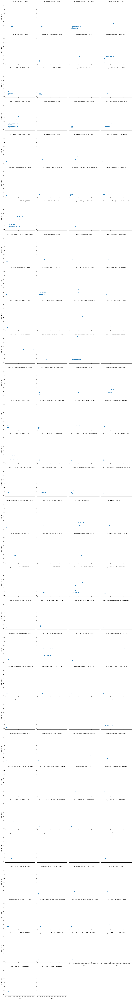

In [ ]:
g = sns.FacetGrid(df4, col="Cpu", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Ram_in_GB")
g.add_legend()
plt.show()

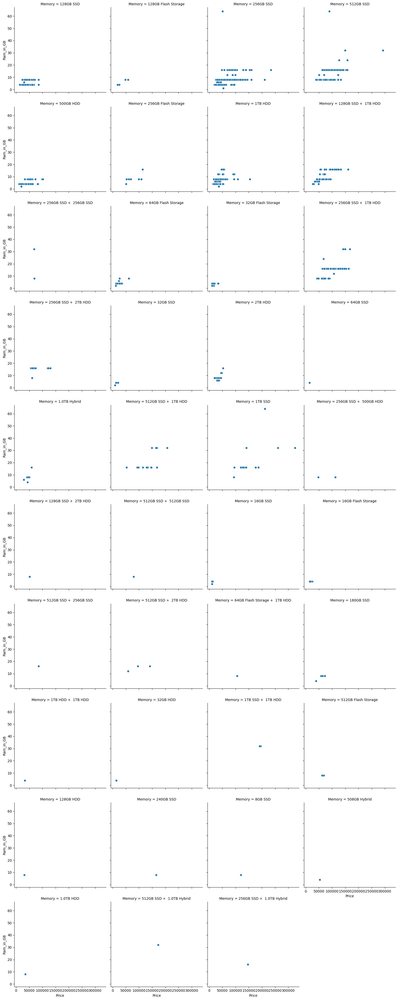

In [ ]:
g = sns.FacetGrid(df4, col="Memory", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Ram_in_GB")
g.add_legend()
plt.show()

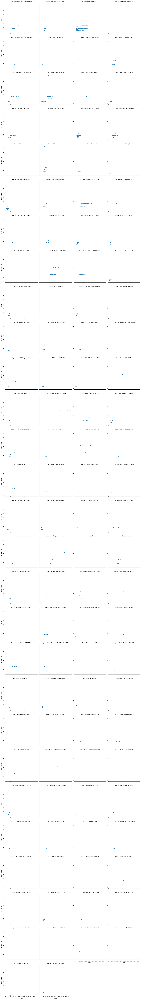

In [ ]:
g = sns.FacetGrid(df4, col="Gpu", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Ram_in_GB")
g.add_legend()
plt.show()

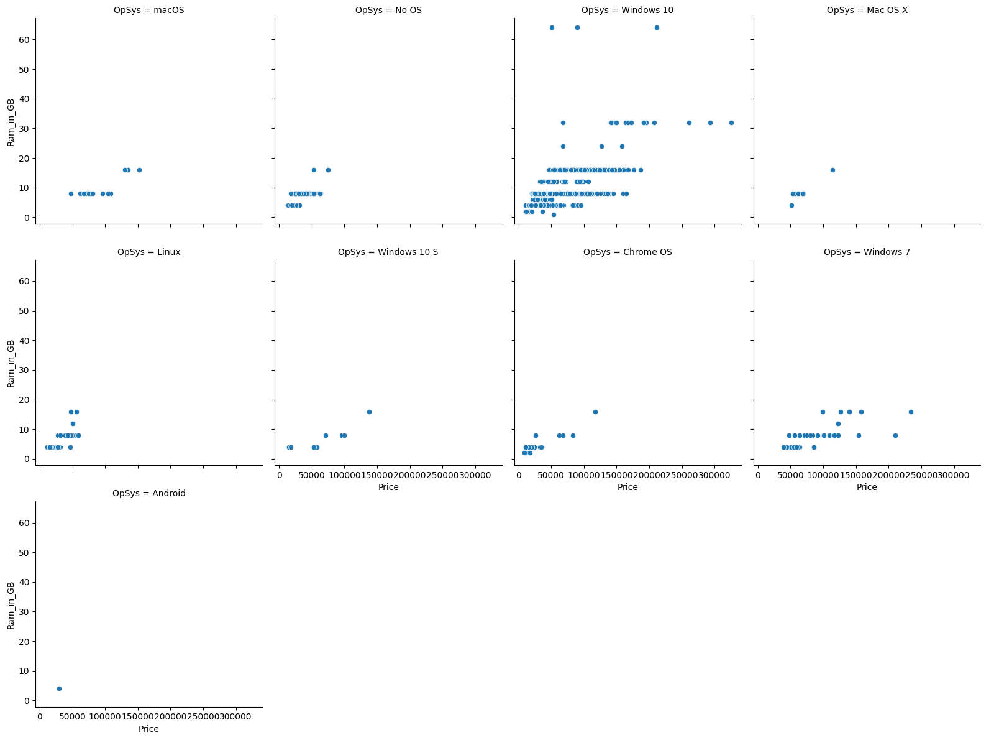

In [ ]:
g = sns.FacetGrid(df4, col="OpSys", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Ram_in_GB")
g.add_legend()
plt.show()

<Axes: xlabel='Price', ylabel='Weight(kg)'>

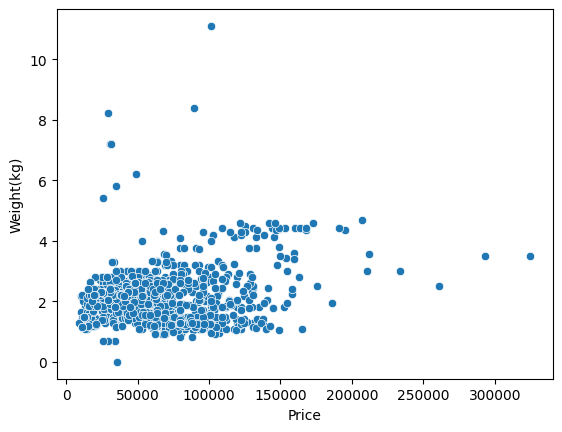

In [ ]:
sns.scatterplot(data = df4, x =  "Price", y =  "Weight(kg)")

as we can see weight is not creating much impact over the prices.

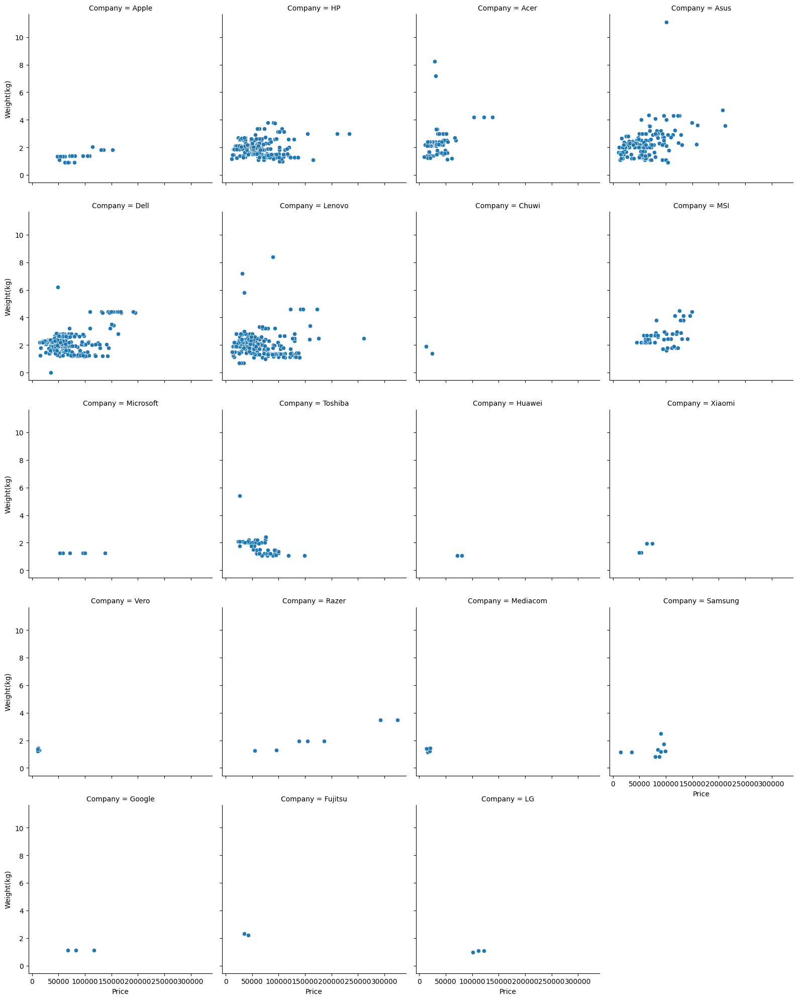

In [ ]:
g = sns.FacetGrid(df4, col="Company", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Weight(kg)")
g.add_legend()
plt.show()

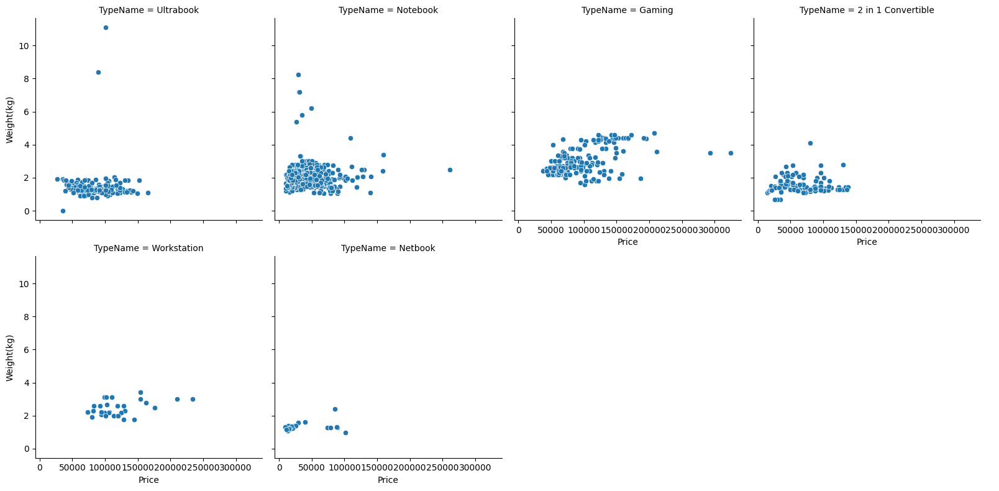

In [ ]:
g = sns.FacetGrid(df4, col="TypeName", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Weight(kg)")
g.add_legend()
plt.show()

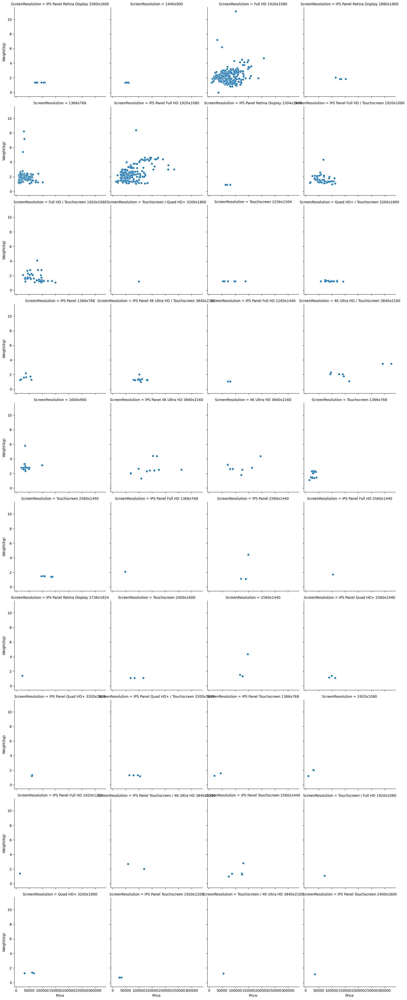

In [ ]:
g = sns.FacetGrid(df4, col="ScreenResolution", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Weight(kg)")
g.add_legend()
plt.show()

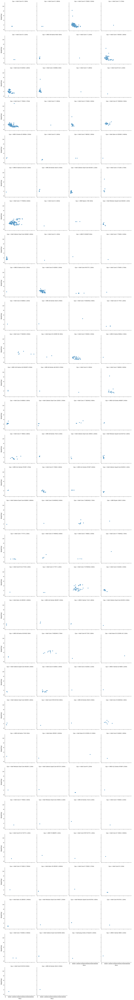

In [ ]:
g = sns.FacetGrid(df4, col="Cpu", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Weight(kg)")
g.add_legend()
plt.show()

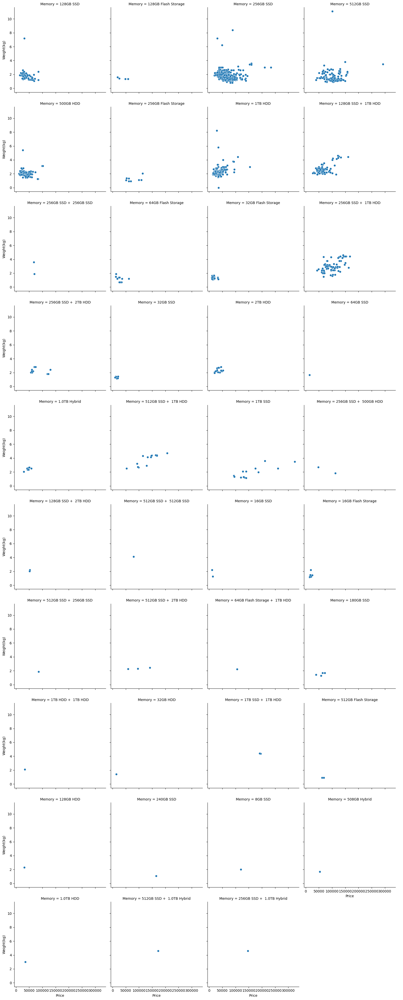

In [ ]:
g = sns.FacetGrid(df4, col="Memory", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Weight(kg)")
g.add_legend()
plt.show()

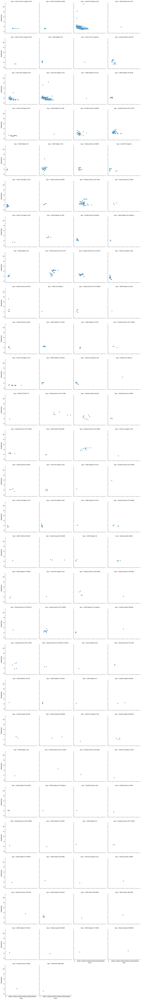

In [ ]:
g = sns.FacetGrid(df4, col="Gpu", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Weight(kg)")
g.add_legend()
plt.show()

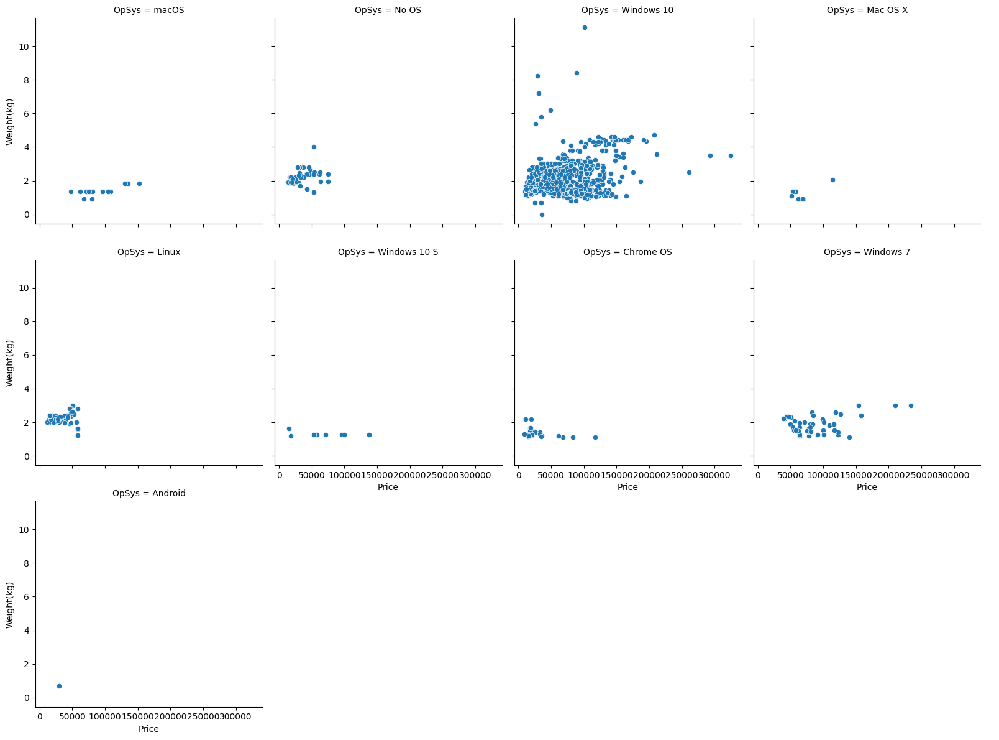

In [ ]:
g = sns.FacetGrid(df4, col="OpSys", col_wrap=4, height=4)
g.map(sns.scatterplot, "Price", "Weight(kg)")
g.add_legend()
plt.show()

# Categorical- Numerical Variables

<Axes: xlabel='Company', ylabel='Price'>

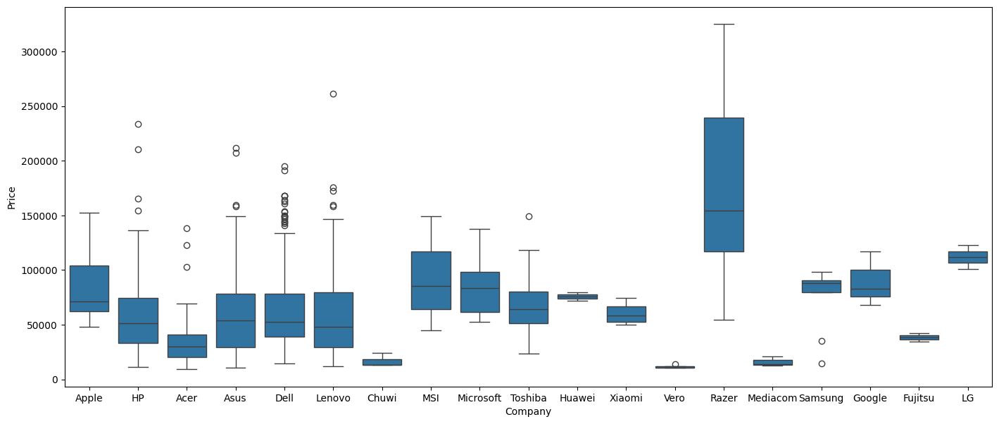

In [ ]:
#box plot for Company vs price
plt.figure(figsize = (17,7))
sns.boxplot(data = df4, x = 'Company', y = 'Price')

as we can see Razer company laptops are of much higher price compare to other companies.  
Chuvi, Vero and Mediacom company laptops are of lower prices.

<Axes: xlabel='TypeName', ylabel='Price'>

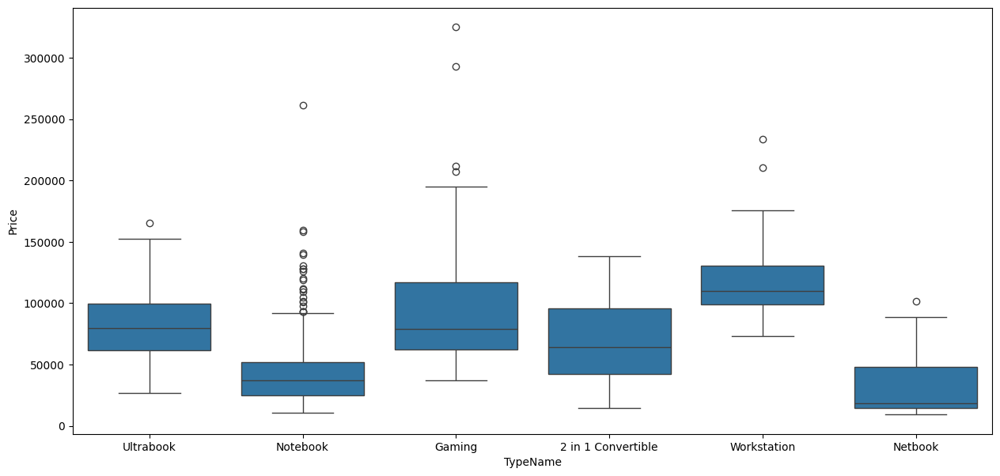

In [ ]:
#box plot for TypeName vs price
plt.figure(figsize = (15,7))
sns.boxplot(data = df4, x = 'TypeName', y = 'Price')

Workstation laptops having higher prices and Netbook having lower prices compare to other laptops

<Axes: xlabel='Price', ylabel='ScreenResolution'>

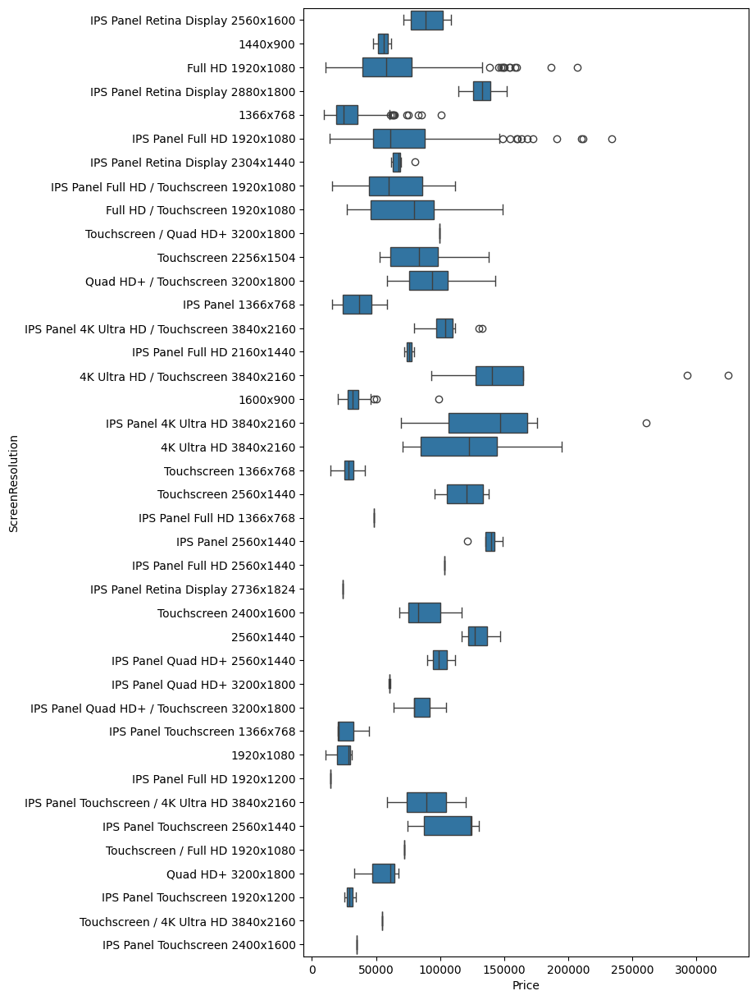

In [ ]:
#box plot for ScreenResolution vs price
plt.figure(figsize = (7,15))
sns.boxplot(data = df4, y = 'ScreenResolution', x = 'Price')

 laptops having 4k ultra hd / touch screen 3840 * 2160 is most costlier   
and 1920 * 1080 and 1366 * 786 are least costlier

<Axes: xlabel='Price', ylabel='Cpu'>

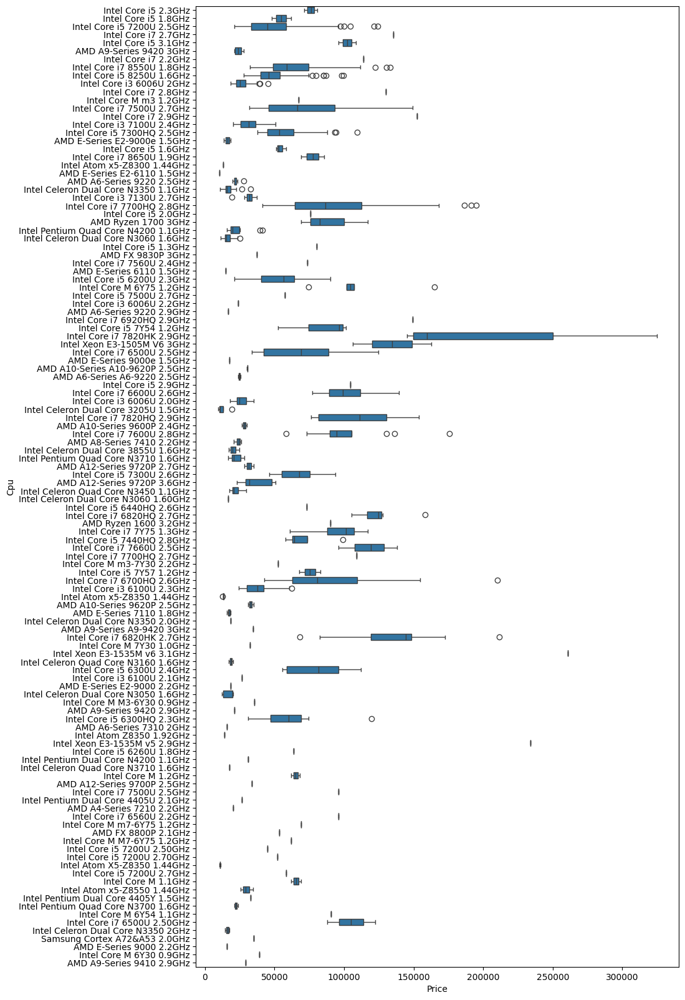

In [ ]:
#box plot for Cpu vs price
plt.figure(figsize = (10,20))
sns.boxplot(data = df4, y = 'Cpu', x = 'Price')

laptops having Intel core i7 7820HK 2.9GHz are more costlier compare to others

<Axes: xlabel='Price', ylabel='Memory'>

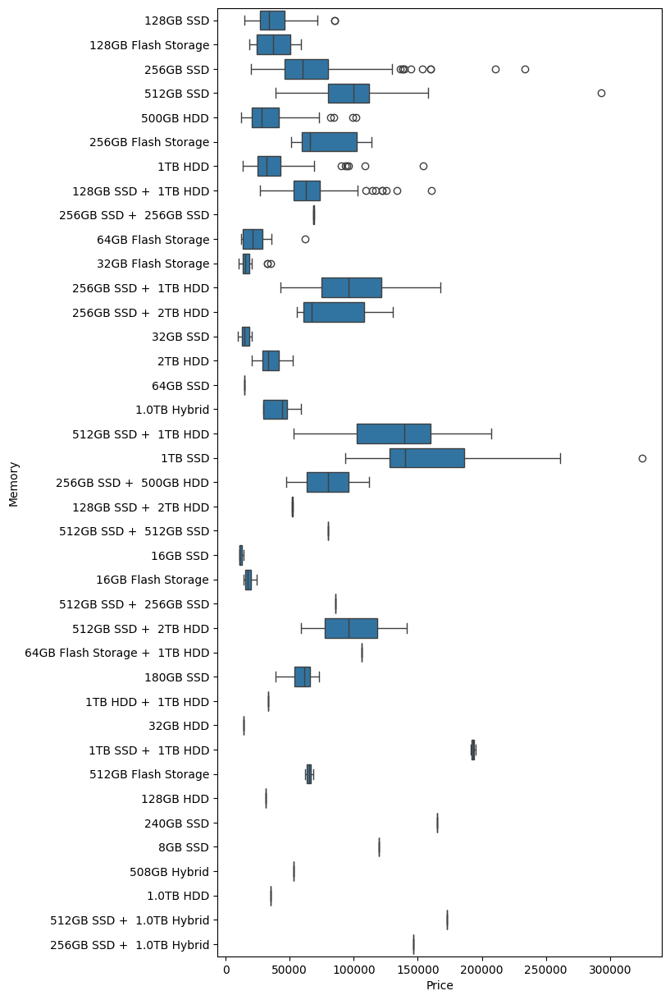

In [ ]:
#box plot for Memory vs price
plt.figure(figsize = (7,15))
sns.boxplot(data = df4, y = 'Memory', x = 'Price')

laptops having 1TB SSD + 1TB HDD are more costlier compare to others

<Axes: xlabel='Price', ylabel='Gpu'>

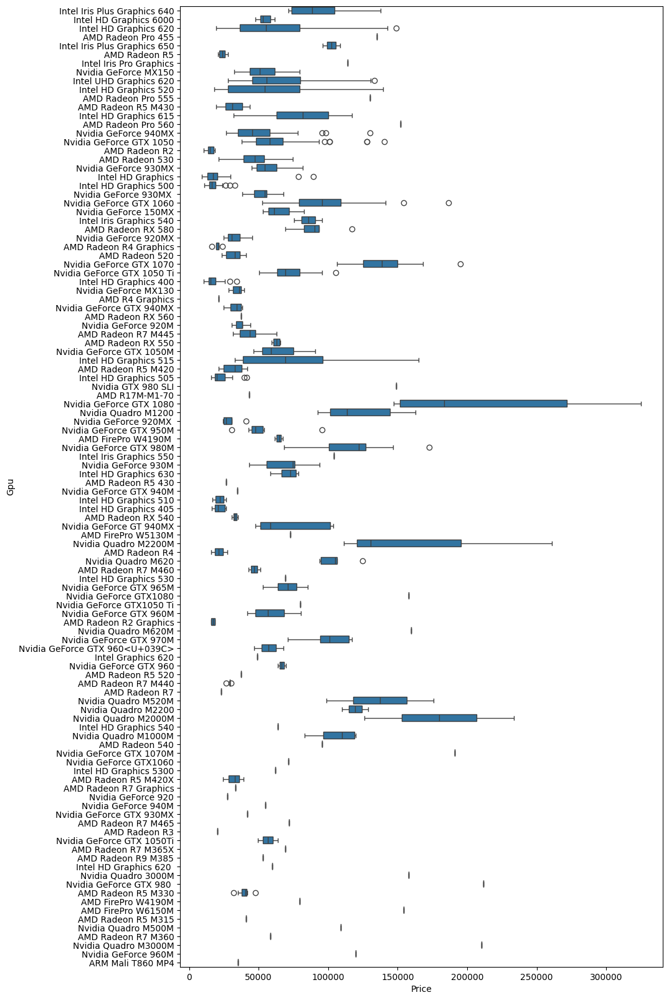

In [ ]:
#box plot for Gpu vs price
plt.figure(figsize = (10,20))
sns.boxplot(data = df4, y = 'Gpu', x = 'Price')

laptops having Nvidia GeForce GTX 1050M are more costlier compare to others

<Axes: xlabel='OpSys', ylabel='Price'>

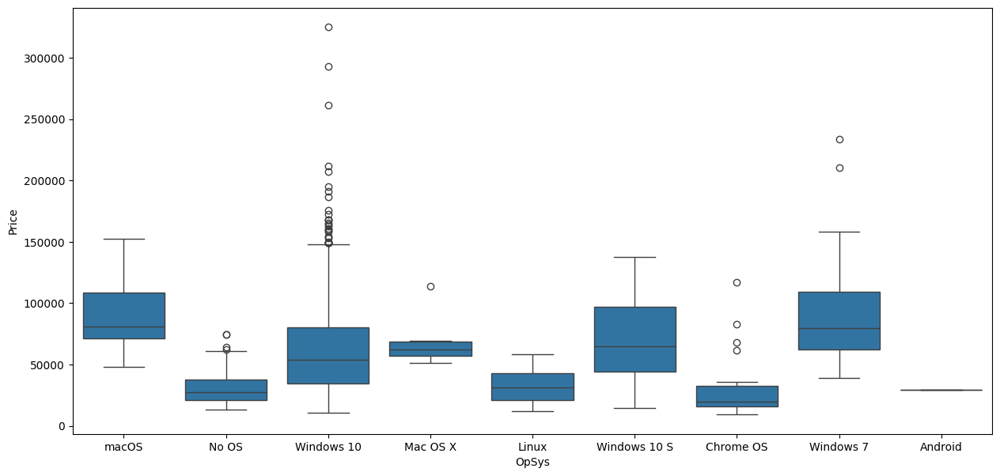

In [ ]:
#box plot for OpSys vs price
plt.figure(figsize = (15, 7))
sns.boxplot(data = df4, x = 'OpSys', y = 'Price')

macos is the most costliest operating system followed by windows 7, windows 10s and windows 10.

In [ ]:
# checking the correlation

df_corr = pd.DataFrame(df_median)
print(df_corr.corr(method = 'spearman')*100)

                        Inches       Price   Ram_in_GB  Weight(kg)  \
Inches              100.000000  -36.066543   -8.871193   85.610520   
Price               -36.066543  100.000000   65.235463  -29.130139   
Ram_in_GB            -8.871193   65.235463  100.000000   -2.677963   
Weight(kg)           85.610520  -29.130139   -2.677963  100.000000   
Company_Apple       -21.335599   13.699858    9.807263  -18.525124   
...                        ...         ...         ...         ...   
OpSys_No OS          15.228172  -21.388457   -5.210563   11.997367   
OpSys_Windows 10     -0.342349   13.751305    8.138818   -3.012314   
OpSys_Windows 10 S   -8.265844    3.065198   -3.128762   -9.463062   
OpSys_Windows 7     -11.590687   17.502820    0.227445   -7.451540   
OpSys_macOS         -16.060410   12.286631    7.728953  -13.689401   

                    Company_Apple  Company_Asus  Company_Chuwi  Company_Dell  \
Inches                 -21.335599      8.086359      -1.463727      1.755835   

- weight and inches have moderate negetive correlationship with price.
- Ram have strong correlationship with price. which implies prices are increasing with ram.  
- Company_Apple, OpSys_Windows 10, OpSys_Windows 7, OpSys_macOS  have mild correlationship with price.   


In [ ]:
df_median.shape

(966, 338)

In [ ]:
# Examine multicollinearity using VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor

# the independent variables set
X_vif = df_median.drop(['Price'], axis = 1)

# VIF dataframe
vif_df = pd.DataFrame()
vif_df['feature'] = X_vif.columns

# calculating VIF for each feature
vif_df['VIF'] =  [variance_inflation_factor(X_vif.values, i)
                     for i in range(len(X_vif.columns))]

print(vif_df)

/usr/local/lib/python3.10/dist-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning:

divide by zero encountered in scalar divide

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning:

invalid value encountered in scalar divide



                feature          VIF
0                Inches     8.300612
1             Ram_in_GB     3.044864
2            Weight(kg)    10.488318
3         Company_Apple          inf
4          Company_Asus     3.689792
..                  ...          ...
332         OpSys_No OS   490.741652
333    OpSys_Windows 10  6328.505941
334  OpSys_Windows 10 S          inf
335     OpSys_Windows 7   257.613201
336         OpSys_macOS          inf

[337 rows x 2 columns]


VIF>5 is not accepted. hence drop those columns

In [ ]:
high_vif_features = vif_df[vif_df['VIF'] > 5]['feature']

In [ ]:
X_vif = X_vif.drop(columns = high_vif_features)

# VIF dataframe
vif_df = pd.DataFrame()
vif_df['feature'] = X_vif.columns

# calculating VIF for each feature
vif_df['VIF'] =  [variance_inflation_factor(X_vif.values, i)
                     for i in range(len(X_vif.columns))]

print(vif_df)

/usr/local/lib/python3.10/dist-packages/statsmodels/regression/linear_model.py:1785: RuntimeWarning:

invalid value encountered in scalar divide



                      feature       VIF
0                   Ram_in_GB  4.753803
1                Company_Asus  1.240124
2             Company_Fujitsu  1.007553
3                  Company_LG  1.023340
4                 Company_MSI  1.067337
..                        ...       ...
123  Gpu_Nvidia Quadro M2000M       NaN
124   Gpu_Nvidia Quadro M2200       NaN
125  Gpu_Nvidia Quadro M3000M       NaN
126   Gpu_Nvidia Quadro M520M       NaN
127   Gpu_Nvidia Quadro M620M       NaN

[128 rows x 2 columns]


After dropping the columns with VIF>5 we are left with minimum no. of features.

In [ ]:
X_vif.shape

(966, 128)

In [ ]:
X_vif.head()

,Ram_in_GB,Company_Asus,Company_Fujitsu,Company_LG,Company_MSI,Company_Samsung,Company_Toshiba,Company_Vero,Company_Xiaomi,TypeName_Netbook,...,Gpu_Nvidia GeForce GTX 980M,Gpu_Nvidia GeForce GTX1050 Ti,Gpu_Nvidia GeForce GTX1080,Gpu_Nvidia Quadro 3000M,Gpu_Nvidia Quadro M1000M,Gpu_Nvidia Quadro M2000M,Gpu_Nvidia Quadro M2200,Gpu_Nvidia Quadro M3000M,Gpu_Nvidia Quadro M520M,Gpu_Nvidia Quadro M620M
0,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,8,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
x = X_vif

In [ ]:
y = df_median['Price']

In [ ]:
x.shape

(966, 128)

In [ ]:
y.shape

(966,)

#Feature selection

In [ ]:
from sklearn.model_selection import StratifiedKFold

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import KFold

# Initialize the model
model = DecisionTreeRegressor(random_state=0)

# Use KFold for regression tasks
kf = KFold(n_splits=5, shuffle=True, random_state=0)

# Initialize RFECV with KFold cross-validation
rfecv = RFECV(estimator=model, step=1, cv=kf, scoring='neg_mean_squared_error')
rfecv.fit(x, y)

# Output the results
print("Optimal number of features: %d" % rfecv.n_features_)
print("Selected features: ", x.columns[rfecv.support_])

Optimal number of features: 36
Selected features:  Index(['Ram_in_GB', 'Company_Asus', 'Company_LG', 'Company_MSI',
       'Company_Samsung', 'Company_Toshiba', 'Company_Vero',
       'TypeName_Netbook', 'ScreenResolution_1600x900',
       'ScreenResolution_4K Ultra HD / Touchscreen 3840x2160',
       'ScreenResolution_4K Ultra HD 3840x2160',
       'ScreenResolution_Full HD / Touchscreen 1920x1080',
       'ScreenResolution_Full HD 1920x1080',
       'ScreenResolution_IPS Panel 1366x768',
       'ScreenResolution_IPS Panel 4K Ultra HD / Touchscreen 3840x2160',
       'ScreenResolution_IPS Panel 4K Ultra HD 3840x2160',
       'ScreenResolution_IPS Panel Full HD / Touchscreen 1920x1080',
       'ScreenResolution_IPS Panel Full HD 1920x1080',
       'ScreenResolution_IPS Panel Full HD 2560x1440',
       'ScreenResolution_IPS Panel Quad HD+ 2560x1440',
       'ScreenResolution_IPS Panel Quad HD+ 3200x1800',
       'ScreenResolution_IPS Panel Touchscreen 2560x1440',
       'ScreenResolutio

In [ ]:
x = x[['Ram_in_GB', 'Company_Asus', 'Company_LG', 'Company_MSI',
       'Company_Samsung', 'Company_Toshiba', 'Company_Vero',
       'TypeName_Netbook', 'ScreenResolution_1600x900',
       'ScreenResolution_4K Ultra HD / Touchscreen 3840x2160',
       'ScreenResolution_4K Ultra HD 3840x2160',
       'ScreenResolution_Full HD / Touchscreen 1920x1080',
       'ScreenResolution_Full HD 1920x1080',
       'ScreenResolution_IPS Panel 1366x768',
       'ScreenResolution_IPS Panel 4K Ultra HD / Touchscreen 3840x2160',
       'ScreenResolution_IPS Panel 4K Ultra HD 3840x2160',
       'ScreenResolution_IPS Panel Full HD / Touchscreen 1920x1080',
       'ScreenResolution_IPS Panel Full HD 1920x1080',
       'ScreenResolution_IPS Panel Full HD 2560x1440',
       'ScreenResolution_IPS Panel Quad HD+ 2560x1440',
       'ScreenResolution_IPS Panel Quad HD+ 3200x1800',
       'ScreenResolution_IPS Panel Touchscreen 2560x1440',
       'ScreenResolution_Quad HD+ / Touchscreen 3200x1800',
       'ScreenResolution_Quad HD+ 3200x1800',
       'ScreenResolution_Touchscreen / Full HD 1920x1080',
       'ScreenResolution_Touchscreen 1366x768',
       'ScreenResolution_Touchscreen 2560x1440',
       'Cpu_Intel Celeron Quad Core N3710 1.6GHz',
       'Cpu_Intel Core i5 7500U 2.7GHz', 'Cpu_Intel Core i7 6820HQ 2.7GHz',
       'Memory_128GB HDD', 'Memory_1TB SSD', 'Memory_256GB SSD +  500GB HDD',
       'Memory_508GB Hybrid', 'Gpu_Nvidia GeForce GTX 930MX',
       'Gpu_Nvidia Quadro M1000M']]

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestRegressor

# Use RandomForestRegressor for regression tasks
model = RandomForestRegressor()

# Apply RFE for feature selection
rfe = RFE(model, n_features_to_select=5)  # Select top 5 features
rfe.fit(x, y)

# Get selected features
selected_features = x.columns[rfe.support_]
print(selected_features)

Index(['Ram_in_GB', 'ScreenResolution_1600x900',
       'ScreenResolution_IPS Panel 4K Ultra HD / Touchscreen 3840x2160',
       'ScreenResolution_IPS Panel Full HD / Touchscreen 1920x1080',
       'ScreenResolution_Quad HD+ / Touchscreen 3200x1800'],
      dtype='object')


In [ ]:
x.shape

(966, 36)

In [ ]:
# performing cross validation technique for that using train_test_split to split X and y
from sklearn.model_selection import train_test_split

In [ ]:
# this is called hold out cross validation technique
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.2, random_state = 0)

#Feature Scaling

In [ ]:
# performing transformation of data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_train_sc = sc.fit_transform(x_train)
x_train_sc

array([[ 0.71714079, -0.34473262, -0.03601412, ...,  0.        ,
        -0.03601412, -0.05096472],
       [ 0.71714079, -0.34473262, -0.03601412, ...,  0.        ,
        -0.03601412, -0.05096472],
       [ 0.71714079, -0.34473262, -0.03601412, ...,  0.        ,
        -0.03601412, -0.05096472],
       ...,
       [ 0.71714079, -0.34473262, -0.03601412, ...,  0.        ,
        -0.03601412, -0.05096472],
       [ 0.71714079, -0.34473262, -0.03601412, ...,  0.        ,
        -0.03601412, -0.05096472],
       [-1.19029311, -0.34473262, -0.03601412, ...,  0.        ,
        -0.03601412, -0.05096472]])

In [ ]:
x_test_sc = sc.fit_transform(x_test)

# Linear Regression

In [ ]:
from sklearn.linear_model import LinearRegression

In [ ]:
lr = LinearRegression()

lr.fit(x_train_sc, y_train)

LinearRegression()

In [ ]:
lr.coef_

array([ 1.04605746e+04, -9.14908933e+02,  1.25293046e+03,  1.39672943e+03,
        1.56955957e+03,  2.80644594e+03, -9.08936650e+02,  2.53397057e+03,
       -1.48526414e+02,  1.63550840e+03,  1.15450535e+03,  3.17604452e+03,
        3.68390627e+03,  6.39687420e+01,  3.70932970e+03,  8.79952914e+02,
        3.87556298e+03,  4.22552937e+03,  2.00727968e+03,  1.12673650e+03,
        7.29408420e+02,  9.64787020e+02,  4.01112282e+03,  8.58090420e+02,
        4.54747351e-13, -1.32749859e+03,  2.66893486e+03, -1.08570405e+03,
        8.04226469e+02,  1.96655989e+03,  0.00000000e+00,  1.36477608e+03,
        1.32225550e+03,  4.54747351e-13, -5.09875012e+02,  1.87737382e+03])

In [ ]:
lr.intercept_

48630.05425492228

In [ ]:
# model evaluation or testing
ycap = lr.predict(x_test_sc)

In [ ]:
ycap

array([ 57794.00983345,  53056.19702578,  65892.61864364,  28923.58090806,
        55834.94728646,  55834.94728646,  36393.71797334,  55834.94728646,
        28923.58090806,  65892.61864364,  28923.58090806,  60366.48852611,
        36393.71797334,  62859.40088982,  55834.94728646,  26144.83064737,
        55834.94728646,  55834.94728646,  19202.96625149,  55834.94728646,
        72497.4263389 ,  46451.38933051,  36393.71797334,  28923.58090806,
        60572.76009414,  36393.71797334,  55834.94728646,  48364.81022118,
        80013.98940726,  45586.0599605 ,  48364.81022118,  60572.76009414,
        47568.40224233,  21557.13449095,  55834.94728646,  46451.38933051,
        55834.94728646,  55834.94728646,  36393.71797334,  55834.94728646,
        79807.71783923,  28923.58090806,  55834.94728646,  62859.40088982,
        48364.81022118,  55834.94728646,  60572.76009414,  55834.94728646,
       100163.46876916,  78283.73657545,  48364.81022118,  28923.58090806,
        37847.78758577,  

In [ ]:
# importing cost function libraries
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [ ]:
print('MAE:', mean_absolute_error(y_test, ycap))
print('MSE:', mean_squared_error(y_test, ycap))
print('RMSE:', np.sqrt(mean_squared_error(y_test, ycap)))

MAE: 13481.684824482005
MSE: 272988738.56912625
RMSE: 16522.370851942716


both MAE and RMSE shows huge errors from the actual values

performing hyper parameter tuning

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import Lasso

# Define the model
lasso = Lasso()

# Define a grid of hyperparameters
param_dist = {'alpha': [0.01, 0.1, 1.0, 10.0, 100.0]}

# Perform randomized search with cross-validation
random_search = RandomizedSearchCV(estimator = lasso, param_distributions = param_dist, cv = 5, n_iter = 10, scoring = 'neg_mean_squared_error')
random_search.fit(x_train_sc, y_train)

# Best parameters
print('Best parameters found: ', random_search.best_params_)
print('Best score: ', random_search.best_score_)

Best parameters found:  {'alpha': 100.0}
Best score:  -326099808.3783206


/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_search.py:307: UserWarning:

The total space of parameters 5 is smaller than n_iter=10. Running 5 iterations. For exhaustive searches, use GridSearchCV.



In [ ]:
# Retrain the model with the best alpha
best_alpha = 100.0
lasso_model = Lasso(alpha = best_alpha)
lasso_model.fit(x_train_sc, y_train)

Lasso(alpha=100.0)

In [ ]:
ycap1 = lasso_model.predict(x_test_sc)

In [ ]:
print('MAE:', mean_absolute_error(y_test, ycap1))
print('MSE:', mean_squared_error(y_test, ycap1))
print('RMSE:', np.sqrt(mean_squared_error(y_test, ycap1)))

MAE: 13514.734828993538
MSE: 273698506.20806783
RMSE: 16543.835897640784


hyperparameter not working still cost function value is high

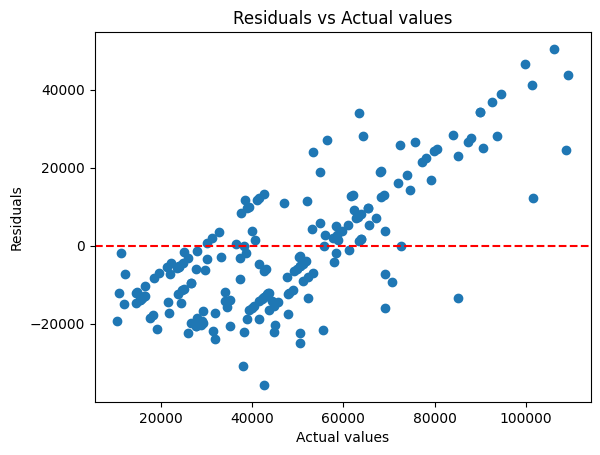

In [ ]:
residuals = y_test - ycap1
plt.scatter(y_test, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel("Actual values")
plt.ylabel("Residuals")
plt.title("Residuals vs Actual values")
plt.show()

#Random Forest Regressor

In [ ]:
X = df_median.drop('Price', axis = 1)

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

In [ ]:
# performing transformation of data
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)
X_train_sc

array([[ 0.51429549,  0.71714079,  0.29366558, ..., -0.07216878,
        -0.18294043, -0.1023289 ],
       [-0.8053094 ,  0.71714079, -0.64162393, ..., -0.07216878,
        -0.18294043, -0.1023289 ],
       [ 0.51429549,  0.71714079,  1.5769698 , ..., -0.07216878,
        -0.18294043, -0.1023289 ],
       ...,
       [ 0.51429549,  0.71714079, -0.22835647, ..., -0.07216878,
        -0.18294043, -0.1023289 ],
       [ 0.51429549,  0.71714079,  0.55467661, ..., -0.07216878,
        -0.18294043, -0.1023289 ],
       [-0.8053094 , -1.19029311,  0.01090363, ..., -0.07216878,
        -0.18294043, -0.1023289 ]])

In [ ]:
X_test_sc = sc.fit_transform(X_test)

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
rf = RandomForestRegressor(n_estimators = 100)
rf.fit(X_train, Y_train)
y_pred_rf = rf.predict(X_test)

In [ ]:
print('MAE:', mean_absolute_error(Y_test, y_pred_rf))
print('MSE:', mean_squared_error(Y_test, y_pred_rf))
print('RMSE:', np.sqrt(mean_squared_error(Y_test, y_pred_rf)))
print("Adjusted R^2:",(1 - (1-rf.score(X_train, Y_train))*(len(Y_train)-1)/(len(Y_train)-X_train.shape[1]-1)))

MAE: 6863.929015860972
MSE: 97256467.09585345
RMSE: 9861.869350982777
Adjusted R^2: 0.9432402081691299


here cost functions are slightly lesser than linear regression but still they are high

#Support Vector Machines

In [ ]:
# Importing SVR library and creating model
from sklearn.svm import SVR
regressor = SVR(kernel = 'rbf')
regressor.fit(X_train, Y_train)

SVR()

In [ ]:
y_pred_svm = regressor.predict(X_test)

In [ ]:
print('MAE:', mean_absolute_error(Y_test, y_pred_svm))
print('MSE:', mean_squared_error(Y_test, y_pred_svm))
print('RMSE:', np.sqrt(mean_squared_error(Y_test, y_pred_svm)))
print("Adjusted R^2:",(1 - (1-regressor.score(X_train, Y_train))*(len(Y_train)-1)/(len(Y_train)-X_train.shape[1]-1)))

MAE: 18186.66826567952
MSE: 517144567.97735393
RMSE: 22740.81282578426
Adjusted R^2: -0.8149729065733857


cost function values are too high

Text(0, 0.5, 'predicted price')

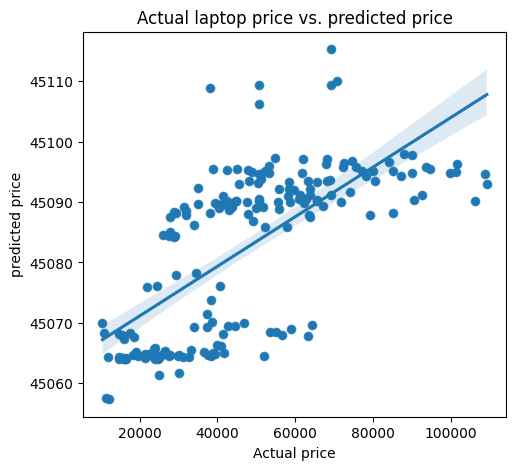

In [ ]:
# plotting actual and predicted values using scatterplot below
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize = (12,5))
grid = gridspec.GridSpec(ncols = 2, nrows = 1, figure = fig)

ax1 = fig.add_subplot(grid[0,0])

sns.scatterplot(x = Y_test, y = y_pred_svm, ax = ax1)
sns.regplot(x = Y_test, y = y_pred_svm, ax = ax1)

ax1.set_title('Actual laptop price vs. predicted price')
ax1.set_xlabel('Actual price')
ax1.set_ylabel('predicted price')

This was done without scaling let's see if we can observe any difference if we scale the data.

In [ ]:
from sklearn.svm import SVR
regressor = SVR(kernel = 'rbf')
regressor.fit(X_train_sc, Y_train)

SVR()

In [ ]:
y_pred_svm = regressor.predict(X_test_sc)

In [ ]:
print('MAE:', mean_absolute_error(Y_test, y_pred_svm))
print('MSE:', mean_squared_error(Y_test, y_pred_svm))
print('RMSE:', np.sqrt(mean_squared_error(Y_test, y_pred_svm)))
print("Adjusted R^2:",(1 - (1-regressor.score(X_train_sc, Y_train))*(len(Y_train)-1)/(len(Y_train)-X_train_sc.shape[1]-1)))

MAE: 18190.979673860144
MSE: 517312274.38883454
RMSE: 22744.499871152027
Adjusted R^2: -0.8154136420715803


Text(0, 0.5, 'predicted price')

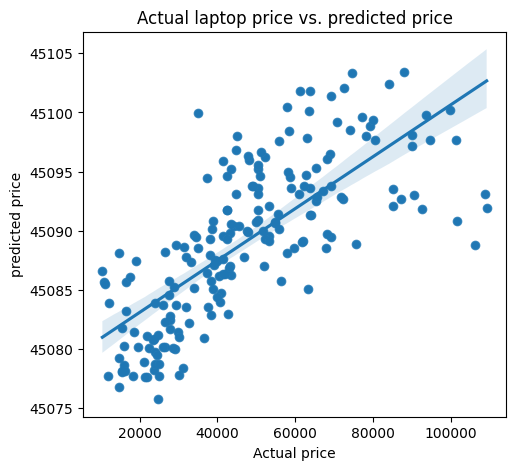

In [ ]:
# plotting actual and predicted values using scatterplot below
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize = (12,5))
grid = gridspec.GridSpec(ncols = 2, nrows = 1, figure = fig)

ax1 = fig.add_subplot(grid[0,0])

sns.scatterplot(x = Y_test, y = y_pred_svm, ax = ax1)
sns.regplot(x = Y_test, y = y_pred_svm, ax = ax1)

ax1.set_title('Actual laptop price vs. predicted price')
ax1.set_xlabel('Actual price')
ax1.set_ylabel('predicted price')

Seems no improvement after scaling the data.

#Decision Tree Regressor

In [ ]:
# importing DecisionTreeRegressor from sklearn library
from sklearn.tree import DecisionTreeRegressor

In [ ]:
#creating an object for our model
model = DecisionTreeRegressor()
model.fit(X_train, Y_train)
pred_dt = model.predict(X_test)

In [ ]:
print('MAE:', mean_absolute_error(Y_test, pred_dt))
print('MSE:', mean_squared_error(Y_test, pred_dt))
print('RMSE:', np.sqrt(mean_squared_error(Y_test, pred_dt)))
print("Adjusted R^2:",(1 - (1-model.score(X_train, Y_train))*(len(Y_train)-1)/(len(Y_train)-X_train.shape[1]-1)))

MAE: 9462.280824742267
MSE: 186957589.5584775
RMSE: 13673.243563927233
Adjusted R^2: 0.9977577058387728


Text(0, 0.5, 'predicted price')

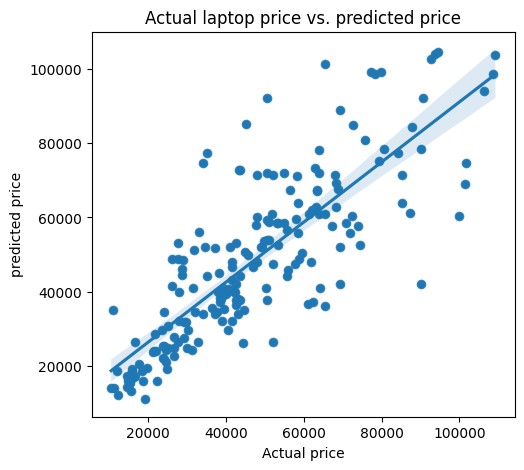

In [ ]:
# plotting actual and predicted values using scatterplot below
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize = (12,5))
grid = gridspec.GridSpec(ncols = 2, nrows = 1, figure = fig)

ax1 = fig.add_subplot(grid[0,0])

sns.scatterplot(x = Y_test, y = pred_dt, ax = ax1)
sns.regplot(x = Y_test, y = pred_dt, ax = ax1)

ax1.set_title('Actual laptop price vs. predicted price')
ax1.set_xlabel('Actual price')
ax1.set_ylabel('predicted price')

[Text(0.5199998882361776, 0.9875, 'x[1] <= 7.0\nsquared_error = 561709229.129\nsamples = 772\nvalue = 48630.054'),
 Text(0.27287306215008816, 0.9625, 'x[2] <= 1.285\nsquared_error = 213805714.082\nsamples = 313\nvalue = 31116.196'),
 Text(0.14278061110156642, 0.9375, 'x[2] <= 1.256\nsquared_error = 473902327.296\nsamples = 14\nvalue = 63616.32'),
 Text(0.13465350556124087, 0.9125, 'x[185] <= 0.5\nsquared_error = 244104484.352\nsamples = 9\nvalue = 50556.8'),
 Text(0.12987285524340234, 0.8875, 'x[105] <= 0.5\nsquared_error = 54945745.92\nsamples = 3\nvalue = 30138.72'),
 Text(0.12796059511626692, 0.8625, 'x[54] <= 0.5\nsquared_error = 70968.96\nsamples = 2\nvalue = 35377.92'),
 Text(0.12604833498913148, 0.8375, 'squared_error = 0.0\nsamples = 1\nvalue = 35644.32'),
 Text(0.12987285524340234, 0.8375, 'squared_error = 0.0\nsamples = 1\nvalue = 35111.52'),
 Text(0.13178511537053775, 0.8625, 'squared_error = -0.0\nsamples = 1\nvalue = 19660.32'),
 Text(0.13943415587907942, 0.8875, 'x[24] <=

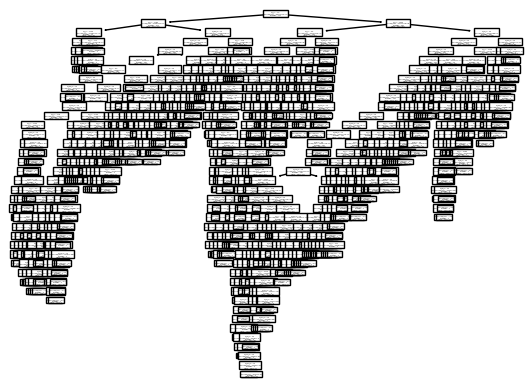

In [ ]:
from sklearn import tree
tree.plot_tree(model)

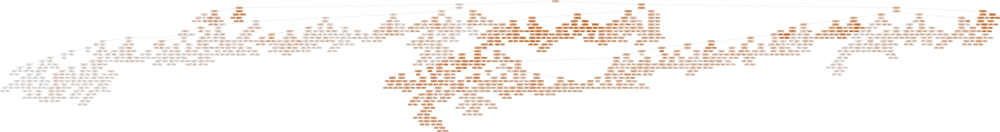

In [ ]:
#adding graphics to the tree
import graphviz
dot_data = tree.export_graphviz(model, out_file=None,filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
graph

It is splitting till the leaf node hence a big tree but we can tune it later.

In [ ]:
model.score(X_train, Y_train) #R^2 close to 1

0.9987378006926425

In [ ]:
model.score(X_test, Y_test)

0.6698411620506892

Apparently, our model is overfiting the training data. therefore, we need to initialize hyperparameters to our model to avoid letting it split till the leafnode.

We got almost 100% score on training data.

On test data we got 65% score.

That's why we are getting high score on our training data and less score on test data.

Let's perform hyperparameter tuning to address this issue.

There are ample tuning methods but we are going to use GridSearch or RandomizedSearch for hyper parameters tuning.

#cross validation

In [ ]:
# Performing crossvalidation to pick the best regression model
#Random Forest Regressor
from sklearn.model_selection import cross_val_score
score_train = cross_val_score(rf, X_train, Y_train, scoring = 'neg_mean_squared_error', cv = 10)

In [ ]:
score_train

array([-1.46056963e+08, -1.20454263e+08, -1.39048343e+08, -1.40648389e+08,
       -1.11384458e+08, -1.65971742e+08, -8.84236498e+07, -1.73973682e+08,
       -1.46637893e+08, -1.17399496e+08])

In [ ]:
from numpy import absolute
print(absolute(np.mean(score_train)))

134999887.8089241


In [ ]:
score_test = cross_val_score(rf, X_test, Y_test, scoring = 'neg_mean_squared_error', cv = 10)

In [ ]:
score_test

array([-3.32163611e+08, -1.05779292e+08, -2.01189220e+08, -1.09925466e+08,
       -1.02377900e+08, -1.47947564e+08, -1.44657481e+08, -1.39254575e+08,
       -1.97625667e+08, -1.42358173e+08])

In [ ]:
print(absolute(np.mean(score_test)))

162327895.04837263


In [ ]:
#Decision Tree Regressor
score_trn = cross_val_score(model, X_train,Y_train, scoring = 'neg_mean_squared_error', cv = 10)
print(absolute(np.mean(score_trn)))

239623957.76785713


In [ ]:
score_tst = cross_val_score(model, X_test, Y_test, scoring = 'neg_mean_squared_error', cv = 10)
print(absolute(np.mean(score_tst)))

263903678.74723524


In [ ]:
#svm
s_trn = cross_val_score(regressor, X_train,Y_train, scoring = 'neg_mean_squared_error', cv = 10)
print(absolute(np.mean(s_trn)))

576892899.1424888


In [ ]:
s_tst = cross_val_score(model, X_test, Y_test, scoring = 'neg_mean_squared_error', cv = 10)
print(absolute(np.mean(s_tst)))

254450309.02502856


If you observe crossvalscore of both training and test data of each model,RandomForest displayed lesser values for mean squared error comparitively.

#Hyper parameter tuning for Random Forest Regressor

In [ ]:
# Hyper parameters range intialization for tuning
#Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 100, stop = 500, num = 5)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10, 15, 100]
parameters={'n_estimators': n_estimators,
            "max_depth" : [1,3,5,7,9,11,12],
           "min_samples_leaf":[1,2,3,4,5,6,7,8,9,10],
           'min_samples_split': min_samples_split,
           "max_features":["auto","sqrt",None]
           }

In [ ]:
RRF = RandomizedSearchCV(rf, param_distributions=parameters, cv=5, n_iter=10,n_jobs=-1)
#cross validation is 5 with n_jobs = -1 ( that is parallel processing

# fit the object
RRF.fit(X_train, Y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:425: FitFailedWarning: 
15 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
15 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 1145, in wrapper
    estimator._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 638, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_

RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_jobs=-1,
                   param_distributions={'max_depth': [1, 3, 5, 7, 9, 11, 12],
                                        'max_features': ['auto', 'sqrt', None],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10],
                                        'min_samples_split': [2, 5, 10, 15,
                                                              100],
                                        'n_estimators': [100, 200, 300, 400,
                                                         500]})

In [ ]:
# Display the best estimator
print(RRF.best_estimator_ ,'\n')

# Display the best score
print(RRF.best_score_ ,'\n')

# Display the best selected parameter by the randomizedSearchCV
print(RRF.best_params_)

RandomForestRegressor(max_depth=11, max_features=None, min_samples_leaf=3,
                      min_samples_split=15) 

0.7139140820574801 

{'n_estimators': 100, 'min_samples_split': 15, 'min_samples_leaf': 3, 'max_features': None, 'max_depth': 11}


In [ ]:
# training the RandomForestRegressor with best parameters determined using randomizedSearchCV
tuned_rf = RandomForestRegressor(max_depth=7, max_features=None, min_samples_leaf=2,
                      n_estimators=300)

In [ ]:
tuned_rf.fit(X_train, Y_train)

RandomForestRegressor(max_depth=7, max_features=None, min_samples_leaf=2,
                      n_estimators=300)

In [ ]:
# prediction

tuned_rf_pred = tuned_rf.predict(X_test)

In [ ]:
#random forest in it's naive form
rf.score(X_train, Y_train)

0.9689517660837774

In [ ]:
rf.score(X_test, Y_test)          # R^2 value pre tuning

0.8014461238330092

In [ ]:
#R^2 value of training data post tuning

tuned_rf.score(X_train, Y_train)

0.8441407754075603

In [ ]:
tuned_rf.score(X_test, Y_test)

0.7492755003374769

Text(0, 0.5, 'Predicted Price')

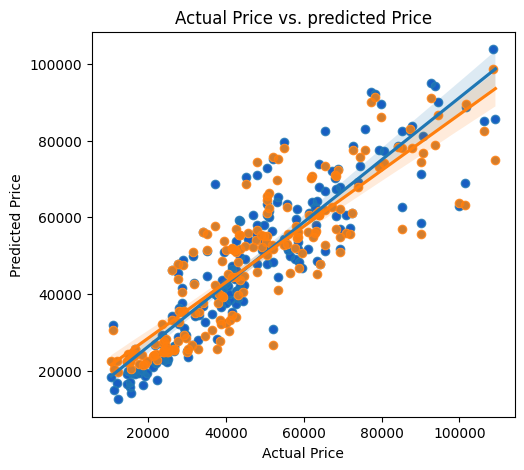

In [ ]:
#before and after tuning

fig = plt.figure(figsize = (12,5))
grid = gridspec.GridSpec(ncols = 2, nrows = 1, figure = fig)

ax1 = fig.add_subplot(grid[0,0])

sns.scatterplot(x = Y_test, y = y_pred_rf, ax = ax1, color = 'blue')
sns.regplot(x = Y_test, y = y_pred_rf, ax = ax1)

sns.scatterplot(x = Y_test, y = tuned_rf_pred, ax = ax1)
sns.regplot(x = Y_test, y = tuned_rf_pred, ax = ax1)

ax1.set_title('Actual Price vs. predicted Price')
ax1.set_xlabel('Actual Price')
ax1.set_ylabel('Predicted Price')

In [ ]:
# with hyperparameter tuning

print('MAE:', mean_absolute_error(Y_test, tuned_rf_pred))
print('MSE:', mean_squared_error(Y_test, tuned_rf_pred))
print('RMSE:', np.sqrt(mean_squared_error(Y_test, tuned_rf_pred)))
print("Adjusted R^2:",(1 - (1-tuned_rf.score(X_train, Y_train))*(len(Y_train)-1)/(len(Y_train)-X_train.shape[1]-1)))

MAE: 8518.937231839313
MSE: 126581809.23881859
RMSE: 11250.858155661665
Adjusted R^2: 0.7217416217018139


In [ ]:
# without hyperparameter tuning

print('MAE:', mean_absolute_error(Y_test, y_pred_rf))
print('MSE:', mean_squared_error(Y_test, y_pred_rf))
print('RMSE:', np.sqrt(mean_squared_error(Y_test, y_pred_rf)))
print("Adjusted R^2:",(1 - (1-rf.score(X_train, Y_train))*(len(Y_train)-1)/(len(Y_train)-X_train.shape[1]-1)))

MAE: 7118.571990938438
MSE: 101898750.34855825
RMSE: 10094.491089131649
Adjusted R^2: 0.9448428839875401


In [ ]:
pip install yellowbrick

In [ ]:
#checking residuals for RandomForestRegressor
from yellowbrick.regressor import ResidualsPlot

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


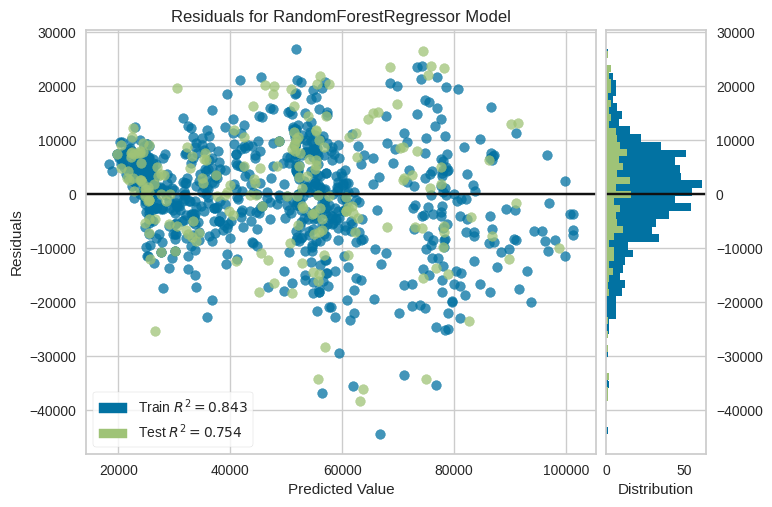

<Axes: title={'center': 'Residuals for RandomForestRegressor Model'}, xlabel='Predicted Value', ylabel='Residuals'>

In [ ]:
visualizer = ResidualsPlot(tuned_rf)
visualizer.fit(X_train, Y_train)
visualizer.score(X_test, Y_test)
visualizer.poof()

The coefficient of determination, or R^2,it is a statistical measure of how well the regression line approximates the actual data.

R^2= 0.843 of the variation in the y values from training data is accounted for by the x values.

R^2= 0.754 of the variation in the y values from test data is accounted for by the x values.

In [ ]:
#creating a barplot showcasing different metrics of decision trees and random forests

# initialize list of lists
d = [['RandomForestregressor without HPT', 0.9455058167590931, 7146.81034451134], ['Randomforestregressor with HPT', 0.7204074567730221, 8518.301065537544]]

# Create the pandas DataFrame
df = pd.DataFrame(d, columns = ['Modelname', 'Adjusted R^2', 'RMSE'])

# print dataframe.
df

,Modelname,Adjusted R^2,RMSE
0,RandomForestregressor without HPT,0.945506,7146.810345
1,Randomforestregressor with HPT,0.720407,8518.301066


<ipython-input-157-0f6d5076fe61>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data = df, x = 'Modelname', y = 'Adjusted R^2', palette = ['green', 'red'])


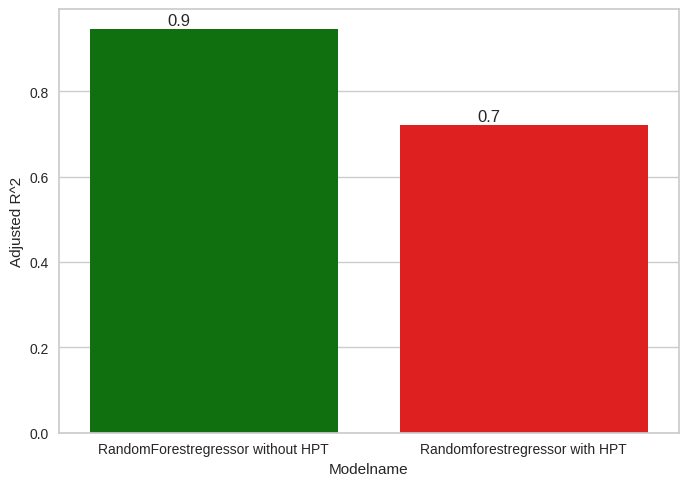

In [ ]:
# comparing Adjusted R^2 values of Random Forest before and after tuning using barplot
ax = sns.barplot(data = df, x = 'Modelname', y = 'Adjusted R^2', palette = ['green', 'red'])
for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))

plt.show()

<ipython-input-158-344aed9e3468>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(data = df, x = 'Modelname', y= 'RMSE', palette = ["#fc9272","#7fcdbb"])


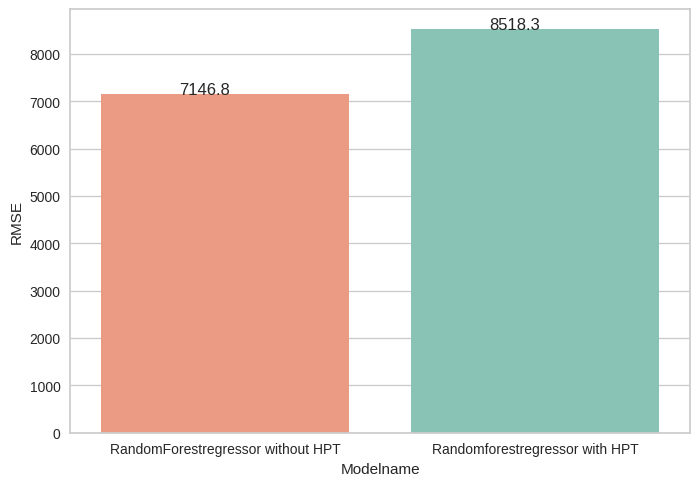

In [ ]:
# comparing rmse values of Random Forest before and after tuning using barplot
ax = sns.barplot(data = df, x = 'Modelname', y= 'RMSE', palette = ["#fc9272","#7fcdbb"])
for p in ax.patches:
  ax.annotate('{:.1f}'.format(p.get_height()), (p.get_x()+0.25, p.get_height()+0.01))

plt.show()

# Conclution  
we can observe RandomForest regressior without HPT has less RMSE value and also it has more Adjusted R^2 value as compare to RandomForest regressior with HPT so we can say that RandomForest regressior without HPT is performing well compare to other models.  
but this model is overfitted over the training data so better to use RandomForest regressior with HPT.

moreover most important feature is Ram which have more influence over the price of the laptop.
and the price is not much depending over the name except for the Apple company for which the correlation over the price is moderate.

In [ ]:
list(X_train.columns)

['Inches',
 'Ram_in_GB',
 'Weight(kg)',
 'Company_Apple',
 'Company_Asus',
 'Company_Chuwi',
 'Company_Dell',
 'Company_Fujitsu',
 'Company_Google',
 'Company_HP',
 'Company_Huawei',
 'Company_LG',
 'Company_Lenovo',
 'Company_MSI',
 'Company_Mediacom',
 'Company_Microsoft',
 'Company_Razer',
 'Company_Samsung',
 'Company_Toshiba',
 'Company_Vero',
 'Company_Xiaomi',
 'TypeName_Gaming',
 'TypeName_Netbook',
 'TypeName_Notebook',
 'TypeName_Ultrabook',
 'TypeName_Workstation',
 'ScreenResolution_1440x900',
 'ScreenResolution_1600x900',
 'ScreenResolution_1920x1080',
 'ScreenResolution_2560x1440',
 'ScreenResolution_4K Ultra HD / Touchscreen 3840x2160',
 'ScreenResolution_4K Ultra HD 3840x2160',
 'ScreenResolution_Full HD / Touchscreen 1920x1080',
 'ScreenResolution_Full HD 1920x1080',
 'ScreenResolution_IPS Panel 1366x768',
 'ScreenResolution_IPS Panel 2560x1440',
 'ScreenResolution_IPS Panel 4K Ultra HD / Touchscreen 3840x2160',
 'ScreenResolution_IPS Panel 4K Ultra HD 3840x2160',
 'Sc

In [ ]:
# Custom data for prediction (replace with your own values)
custom_data = np.array([[15, 16, 1.62, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 1, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 1, 0, 0, 0
                         ]])  # Shape should match the number of features

# Make a prediction
prediction = model.predict(custom_data)
print("Prediction for custom data:", prediction)

Prediction for custom data: [79653.6]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


In [ ]:
# Custom data for prediction (replace with your own values)
custom_data = np.array([[16, 16, 1.2, 0, 0, 0, 0, 0, 0, 0,
                         0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 1, 0, 0, 0, 1,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 1, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
                         0, 0, 0, 0, 0, 1, 0
                         ]])  # Shape should match the number of features

# Make a prediction
prediction = model.predict(custom_data)
print("Prediction for custom data:", prediction)

Prediction for custom data: [61218.72]


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but DecisionTreeRegressor was fitted with feature names
  warnings.warn(


This model is not performing well over the outside data.
here i took two latest models one is   
Lenovo Ideapad slim-3 13th Gen for which the actual price is Rs.65,000 and our model predicts early around Rs.88,000 which is not Reasonable.   
and other brand i took is less known LG Ultrabook for which the actual price is Rs.81,000 and our model predicts Rs.80,616 which is reasonable.